# Home Credit Scorecard Model

### Problem Statement
Home Credit ingin meningkatkan efektifitas dalam menilai resiko kredit dan memberikan pinjaman kepada pelanggan
saat ini ada kekhawatiran pelanggan yang sebenarnya mampu melunasi pinjaman ditolak, atau pinjaman yang diberikan tidak
sesuai dengan kemampuan pelanggan. Oleh karena itu perlu ditingkatkan penilaian skor kredit dengan pendekatan menggunakan metode statistik dan machine Lerning.

### Goal
Meningkatkan akurasi prediksi skor kredit

### Objectives
* Mengembangkan kriteria yang lebih baik untuk penilaian kelayakan pelanggan yang menerima pinjaman
* Membangun model predictive yang handal dan akurat dalam meprediksi skor kredit
* Melakukan analisis resiko terus menerus untuk menyesuaikan perubahan perilaku pelanggan dan keadaan ekonomi

### Business Metric
* Akurasi Model Prediksi skor kredit


## Deskripsi Kolom

**application_{train|test}.csv**:
File utama yang berisi informasi tentang setiap aplikasi pinjaman.
Train file berisi target (apakah pinjaman dilunasi atau tidak), sedangkan test file tidak.
Setiap baris mewakili satu pinjaman dalam dataset.

**bureau.csv:**
Menyimpan informasi tentang semua pinjaman sebelumnya yang dimiliki klien dari lembaga keuangan lain yang dilaporkan ke Biro Kredit (hanya untuk klien yang memiliki pinjaman dalam data sampel).
Untuk setiap pinjaman dalam data sampel, terdapat baris sebanyak jumlah pinjaman yang dimiliki klien di Biro Kredit sebelum tanggal pengajuan.

**bureau_balance.csv:**
Menyimpan saldo bulanan pinjaman sebelumnya di Biro Kredit.
Tabel ini memiliki satu baris untuk setiap bulan riwayat setiap pinjaman sebelumnya yang dilaporkan ke Biro Kredit, artinya tabel ini memiliki (#pinjaman dalam sampel * # kredit sebelumnya relatif * # bulan di mana kita memiliki riwayat yang dapat diamati untuk kredit sebelumnya) baris.

**POS_CASH_balance.csv:**
Menyimpan snapshot saldo bulanan pinjaman POS (point of sales) dan kas sebelumnya yang dimiliki pemohon dengan Home Credit.
Tabel ini memiliki satu baris untuk setiap bulan riwayat setiap pinjaman sebelumnya di Home Credit (pinjaman konsumen dan pinjaman tunai) yang terkait dengan pinjaman dalam data sampel, artinya tabel ini memiliki (#pinjaman dalam sampel * # kartu kredit sebelumnya * # bulan di mana kita memiliki riwayat yang dapat diamati untuk kartu kredit sebelumnya) baris.

**credit_card_balance.csv:**
Menyimpan snapshot saldo bulanan kartu kredit sebelumnya yang dimiliki pemohon dengan Home Credit.
Tabel ini memiliki satu baris untuk setiap bulan riwayat setiap pinjaman sebelumnya di Home Credit (pinjaman konsumen dan pinjaman tunai) yang terkait dengan pinjaman dalam data sampel, artinya tabel ini memiliki (#pinjaman dalam sampel * # kartu kredit sebelumnya * # bulan di mana kita memiliki riwayat yang dapat diamati untuk kartu kredit sebelumnya) baris.

**previous_application.csv:**
Menyimpan semua pengajuan pinjaman Home Credit sebelumnya dari klien yang memiliki pinjaman dalam data sampel.
Ada satu baris untuk setiap pengajuan sebelumnya yang terkait dengan pinjaman dalam data sampel.

**installments_payments.csv:**
Menyimpan riwayat pembayaran untuk kredit yang sebelumnya disalurkan di Home Credit yang terkait dengan pinjaman dalam data sampel.
Ada a) satu baris untuk setiap pembayaran yang dilakukan ditambah b) satu baris masing-masing untuk pembayaran yang terlewat.
Satu baris sama dengan satu pembayaran dari satu angsuran ATAU satu angsuran yang sesuai dengan satu pembayaran dari satu kredit Home Credit sebelumnya yang terkait dengan pinjaman dalam data sampel.

**HomeCredit_columns_description.csv:**
Menyediakan deskripsi untuk setiap kolom dalam berbagai file data.
Penjelasan dalam file ini membantu memahami arti dan tujuan dari setiap variabel.

In [94]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import scipy
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Data Exploration

## Pendekatan Numerik dan Grafis (Univariate & Multivariate Analysis)
Pendekatan numerik dengan nilai statistik yang dilakukan dengan `.describe()`, kemudian pendekatan dengan grafis dengan library `matplotlib dan seaborn`menggunakan univariate analysis dengan violin plot dan box plot, dan yang terakhir pendekatan dengan multivariate analysis dengan heatmap untuk data numerik dan countplot berdasarkan target 

In [152]:
train = pd.read_csv('application_train.csv')

## Train Data Exploration 
File utama yang berisi informasi tentang setiap aplikasi pinjaman.

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


Karena kolom terlalu banyak yakni 122 kolom bertipe data float64(65 kolom), int64(41 kolom) dan object (16 kolom), maka kami akan membagi menjadi beberapa dataframe berdasarkan kategori informasi

In [153]:
# Mengelompokkan kolom berdasarkan kategori informasi
loan = ['SK_ID_CURR', 'TARGET', 'AMT_CREDIT','AMT_ANNUITY', 'AMT_GOODS_PRICE']
borrower= ['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 
                 'REGION_POPULATION_RELATIVE', 'FLAG_MOBIL','FLAG_EMP_PHONE',
                 'FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL', 
                 'CNT_FAM_MEMBERS','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY', 'TARGET']
loan_app = ['HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
                 'LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
                 'LIVE_CITY_NOT_WORK_CITY','TARGET']
biro_kredit = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TARGET']
properti_avg = ['APARTMENTS_AVG', 'BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG',
                 'COMMONAREA_AVG', 'ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG',
                 'LIVINGAPARTMENTS_AVG','LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','TARGET']
properti_medi = ['APARTMENTS_MEDI', 'BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI',
                 'COMMONAREA_MEDI', 'ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI',
                 'LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI']
properti_mode = ['APARTMENTS_MODE', 'BASEMENTAREA_MODE','YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE',
                 'COMMONAREA_MODE', 'ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE',
                 'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE',
                       'TOTALAREA_MODE']
behavior = ['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE',
                 'DAYS_LAST_PHONE_CHANGE','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY',
                  'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
                 'AMT_REQ_CREDIT_BUREAU_YEAR', 'TARGET']
bukti = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5','FLAG_DOCUMENT_6',
              'FLAG_DOCUMENT_7','FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11', 
              'FLAG_DOCUMENT_12','FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16', 
              'FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21', 'TARGET']
cats = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE','TARGET']

### Loan

In [13]:
train[loan].describe()

,SK_ID_CURR,TARGET,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
count,307511.000000,307511.000000,3.075110e+05,307499.000000,3.072330e+05
mean,278180.518577,0.080729,5.990260e+05,27108.573909,5.383962e+05
std,102790.175348,0.272419,4.024908e+05,14493.737315,3.694465e+05
min,100002.000000,0.000000,4.500000e+04,1615.500000,4.050000e+04
25%,189145.500000,0.000000,2.700000e+05,16524.000000,2.385000e+05
50%,278202.000000,0.000000,5.135310e+05,24903.000000,4.500000e+05
75%,367142.500000,0.000000,8.086500e+05,34596.000000,6.795000e+05
max,456255.000000,1.000000,4.050000e+06,258025.500000,4.050000e+06


In [36]:
train[loan].sample()

,SK_ID_CURR,TARGET,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
178663,307042,0,418500.0,44536.5,418500.0


In [23]:
train[loan].isna().sum() / train.size* 100

SK_ID_CURR         0.000000
TARGET             0.000000
AMT_CREDIT         0.000000
AMT_ANNUITY        0.000032
AMT_GOODS_PRICE    0.000741
dtype: float64

In [21]:
train[loan].isna().sum()

SK_ID_CURR           0
TARGET               0
AMT_CREDIT           0
AMT_ANNUITY         12
AMT_GOODS_PRICE    278
dtype: int64

In [22]:
train.size

37516342

Text(0.5, 1.02, 'Distribusi Data Loan dengan Violinplot')

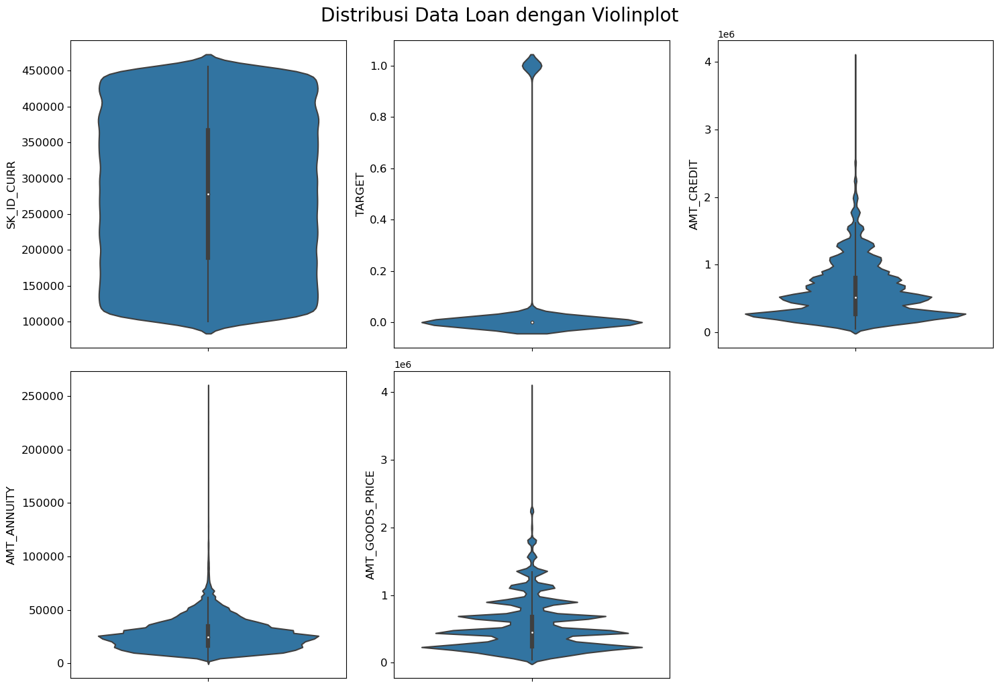

In [21]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(loan)):
    sns.violinplot(y = train[loan[i]], ax = fig.add_subplot(math.ceil(len(loan)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = loan[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Loan dengan Boxplot')

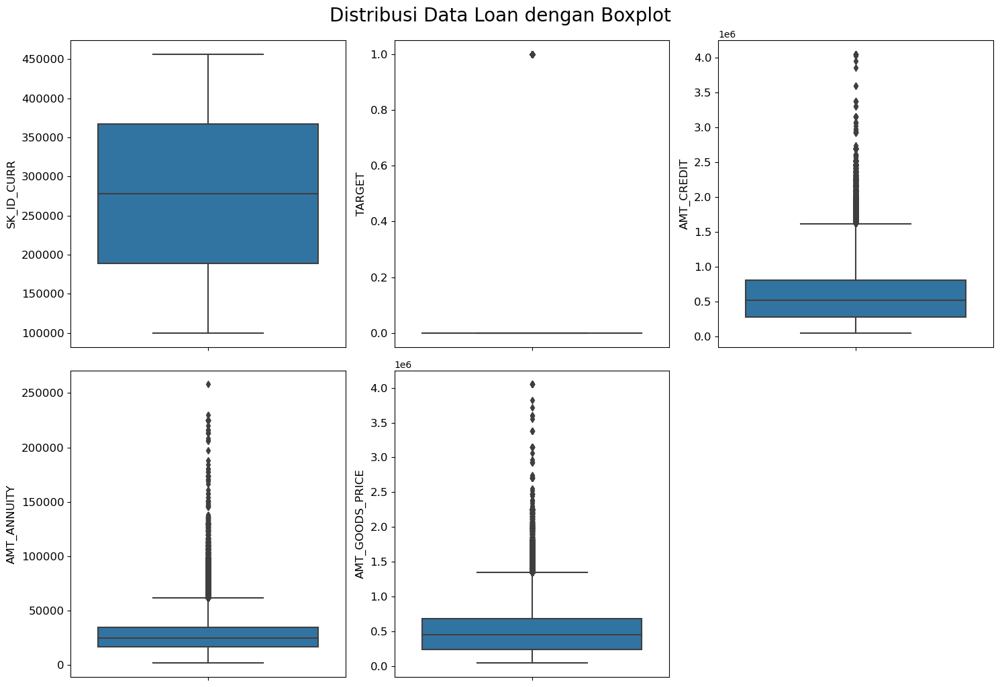

In [20]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(loan)):
    sns.boxplot(y = train[loan[i]], ax = fig.add_subplot(math.ceil(len(loan)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = loan[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan dengan Boxplot", fontsize=20, y=1.02)

Kesimpulan :
- Kolom loan berisi informasi seputar pinjaman dengan 4 kolom numerik dan 1 kolom target 
- Terdapat missing value pada 3 kolom diantaranya yaitu kolom `AMT_ANNUITY` dan`AMT_GOODS_PRICE`
- Terdapat Outlier di 3 kolom diantaranya yaitu kolom `AMT_ANNUITY`,`AMT_CREDIT`dan`AMT_GOODS_PRICE`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 3 kolom diantara yakni `AMT_ANNUITY`,`AMT_CREDIT`dan`AMT_GOODS_PRICE`

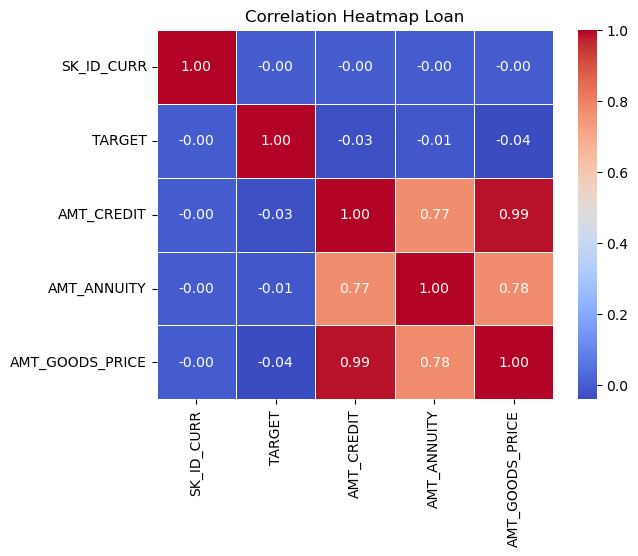

In [34]:
loan_corr = train[loan].corr()
sns.heatmap(loan_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Loan')
plt.show()

- semua kolom dari data loan yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `AMT_GOODS_PRICE` dengan nilai -0.04

### Borrower

In [22]:
train[borrower].describe()

,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,REGION_POPULATION_RELATIVE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,TARGET
count,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000
mean,0.417052,1.687979e+05,-16036.995067,63815.045904,0.020868,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,0.080729
std,0.722121,2.371231e+05,4363.988632,141275.766519,0.013831,0.001803,0.384280,0.399526,0.043164,0.449521,0.231307,0.910682,0.509034,0.502737,0.272419
min,0.000000,2.565000e+04,-25229.000000,-17912.000000,0.000290,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
25%,0.000000,1.125000e+05,-19682.000000,-2760.000000,0.010006,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,0.000000
50%,0.000000,1.471500e+05,-15750.000000,-1213.000000,0.018850,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,0.000000
75%,1.000000,2.025000e+05,-12413.000000,-289.000000,0.028663,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,3.000000,2.000000,2.000000,0.000000
max,19.000000,1.170000e+08,-7489.000000,365243.000000,0.072508,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,20.000000,3.000000,3.000000,1.000000


In [23]:
train[borrower].isna().sum()

CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
REGION_POPULATION_RELATIVE     0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
CNT_FAM_MEMBERS                2
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
TARGET                         0
dtype: int64

Text(0.5, 1.02, 'Distribusi Data Borrower dengan Violinplot')

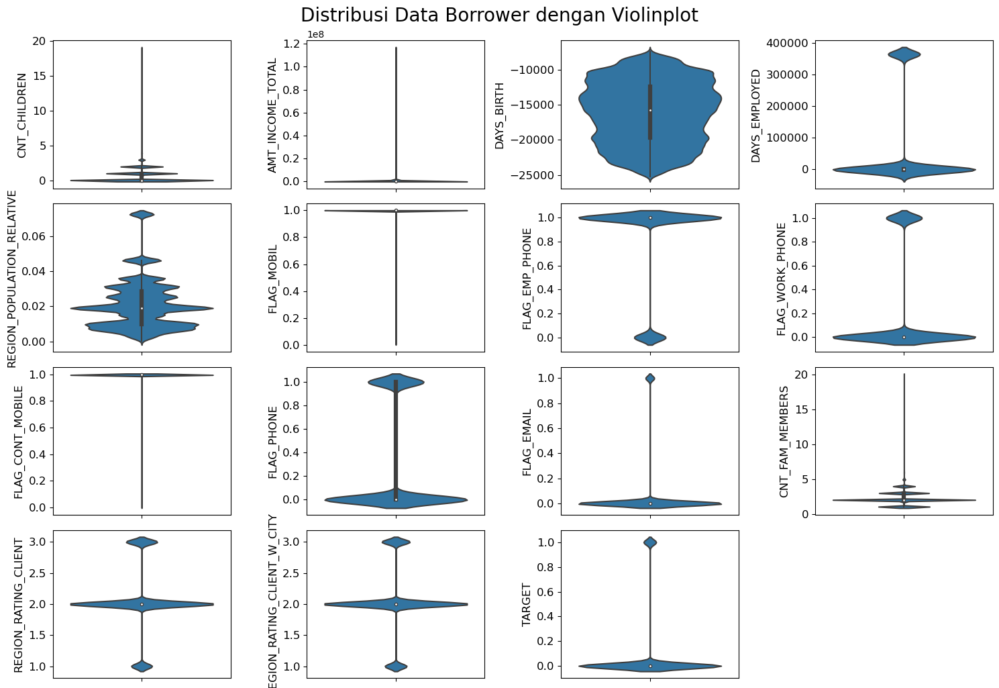

In [28]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(borrower)):
    sns.violinplot(y = train[borrower[i]], ax = fig.add_subplot(math.ceil(len(borrower)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = borrower[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Borrower dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Borrower dengan Boxplot')

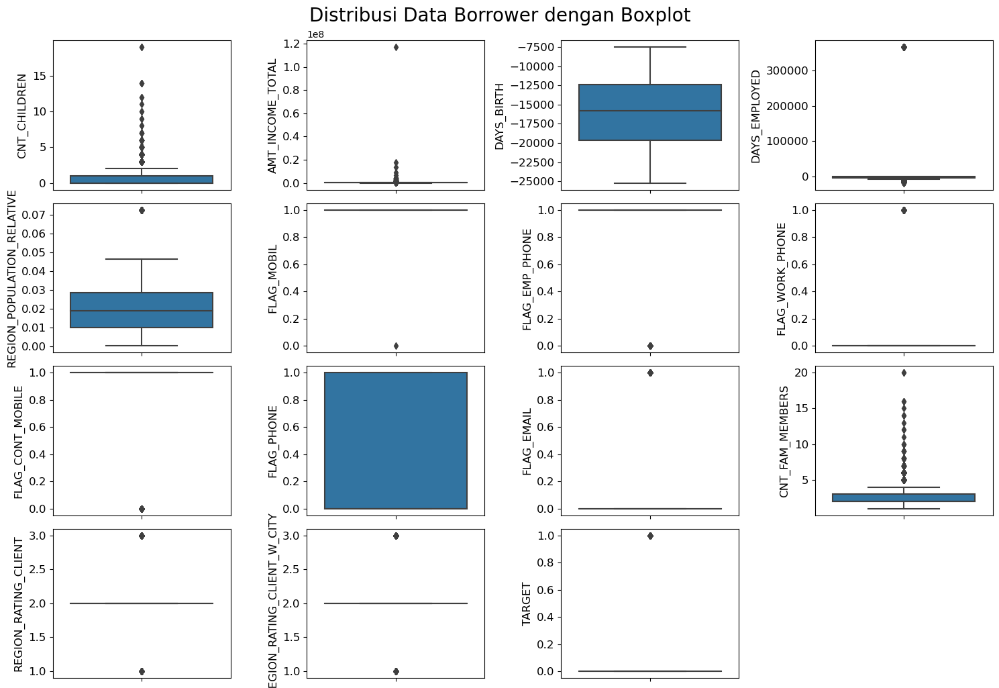

In [31]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(borrower)):
    sns.boxplot(y = train[borrower[i]], ax = fig.add_subplot(math.ceil(len(borrower)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = borrower[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Borrower dengan Boxplot", fontsize=20, y=1.02)

Kesimpulan :
- Kolom borrower berisi informasi seputar peminjam dengan 14 kolom numerik dan 1 kolom target 
- Terdapat missing value pada 1 kolom diantaranya yaitu kolom `CNT_FAM_MEMBERS`
- Terdapat Outlier di 5 kolom diantaranya yaitu kolom `CNT_CHILDREN`, `AMT_INCOME_TOTAL`, `DAYS_EMPLOYED`,`REGION_POPULATION_RELATIVE`, `CNT_FAM_MEMBERS`
- Terdapat 6 kolom biner diantaranya yakni `FLAG_MOBIL`, `FLAG_EMP_PHONE`, `FLAG_WORK_PHONE`, `FLAG_CONT_MOBILE`, `FLAG_PHONE`, `FLAG_EMAIL`
- Terdapat 2 kolom multinomial diantaranya yakni `REGION_RATING_CLIENT`, `REGION_RATING_CLIENT_W_CITY`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 5 kolom diantara yakni `CNT_CHILDREN`, `AMT_INCOME_TOTAL`, `DAYS_EMPLOYED`,`REGION_POPULATION_RELATIVE`, `CNT_FAM_MEMBERS`

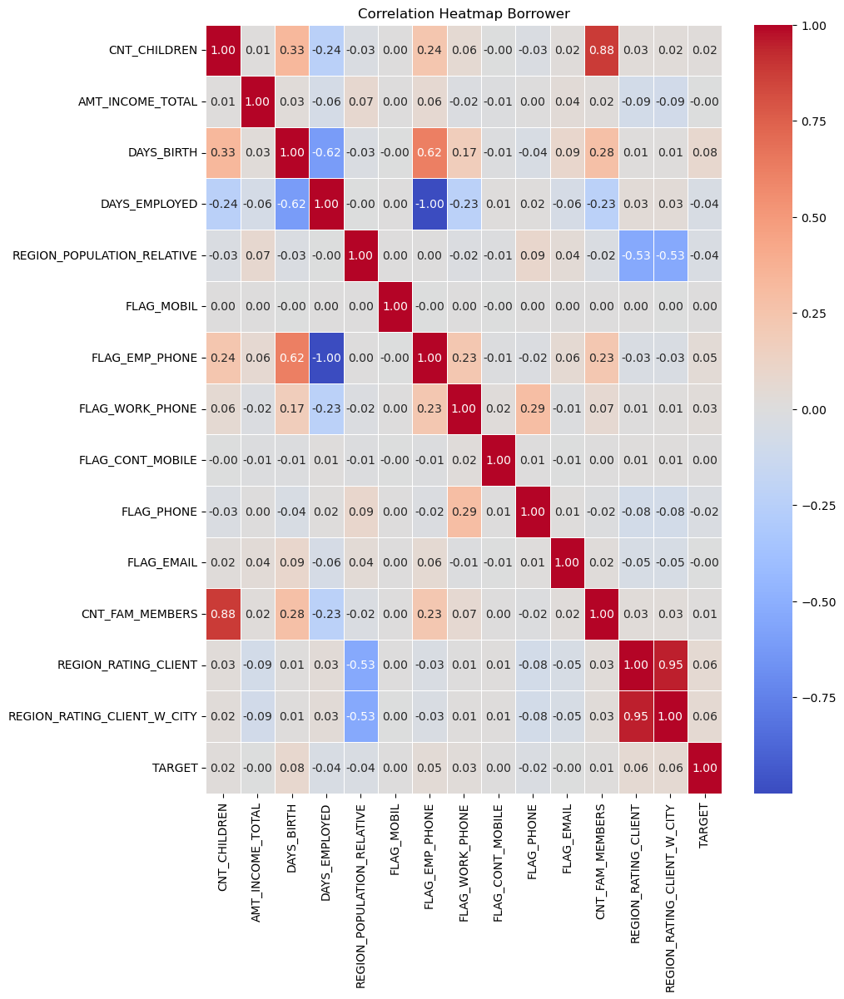

In [35]:
plt.figure(figsize=(10,12))
borrower_corr = train[borrower].corr()
sns.heatmap(borrower_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Borrower')
plt.show()

Kesimpulan:
- semua kolom dari data borrower yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `DAYS_BIRTH` dengan nilai 0.08

### Loan App

In [36]:
train[loan_app].describe()

,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,TARGET
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.080729
std,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,0.272419
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [37]:
train[loan_app].isna().sum()

HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_NOT_WORK_CITY         0
LIVE_CITY_NOT_WORK_CITY        0
TARGET                         0
dtype: int64

Text(0.5, 1.02, 'Distribusi Data Loan App dengan Violinplot')

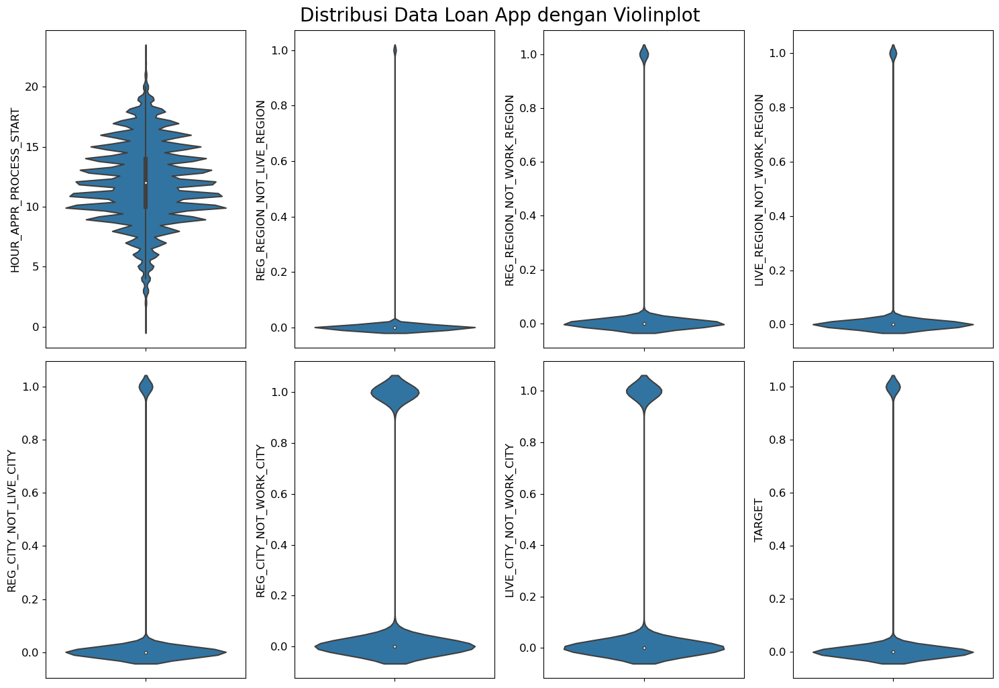

In [38]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(loan_app)):
    sns.violinplot(y = train[loan_app[i]], ax = fig.add_subplot(math.ceil(len(loan_app)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = loan_app[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan App dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Loan App dengan Boxplot')

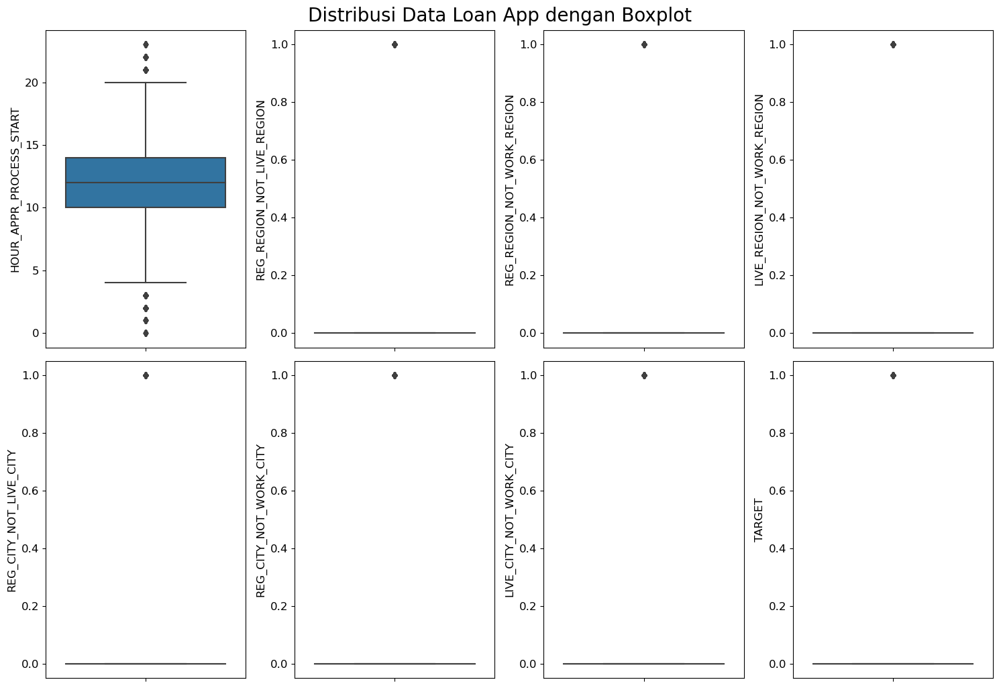

In [39]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(loan_app)):
    sns.boxplot(y = train[loan_app[i]], ax = fig.add_subplot(math.ceil(len(loan_app)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = loan_app[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan App dengan Boxplot", fontsize=20, y=1.02)

Kesimpulan :
- Kolom kategori Loan App berisi informasi seputar aplikasi pinjaman dengan 7 kolom numerik dan 1 kolom target 
- Tidak terdapat missing value 
- Terdapat Outlier di 1 kolom diantaranya yaitu kolom `HOUR_APPR_PROCESS_START`
- Terdapat 7 kolom biner diantaranya yakni `REG_REGION_NOT_LIVE_REGION `, `REG_REGION_NOT_WORK_REGION `, `LIVE_REGION_NOT_WORK_REGION`, `REG_CITY_NOT_LIVE_CITY `, `REG_CITY_NOT_WORK_CITY`, `LIVE_CITY_NOT_WORK_CITY`
- Terdapat 2 kolom multinomial diantaranya yakni `REGION_RATING_CLIENT`, `REGION_RATING_CLIENT_W_CITY`, `TARGET`
- Tidak terdapat positively skewed(dilihat dari perbedaan antara mean dan median) dan cenderung simetris pada kolom `HOUR_APPR_PROCESS_START` 

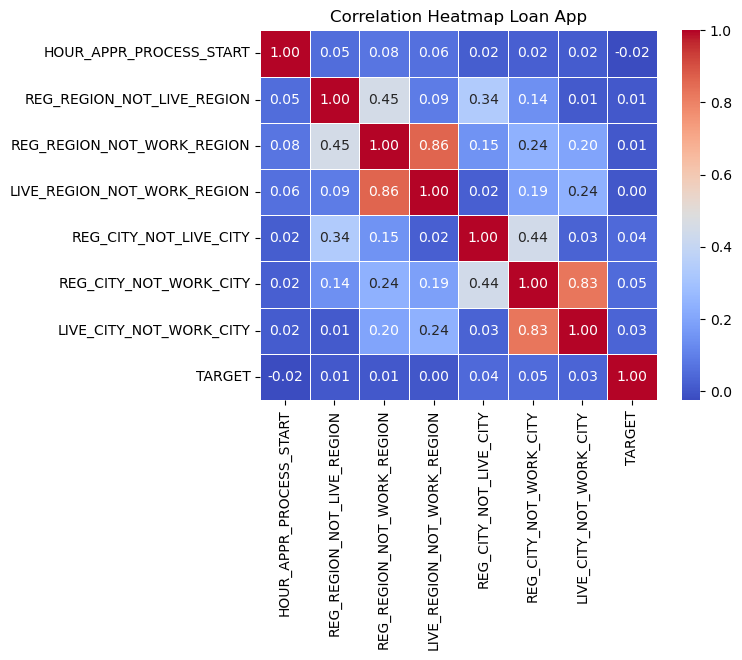

In [41]:

loan_app_corr = train[loan_app].corr()
sns.heatmap(loan_app_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Loan App')
plt.show()

Kesimpulan:
- semua kolom dari data loan app yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `REG_CITY_NOT_WORK_CITY` dengan nilai 0.05

### Biro Kredit

In [49]:
train[biro_kredit].describe()

,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,TARGET
count,134133.000000,3.068510e+05,246546.000000,307511.000000
mean,0.502130,5.143927e-01,0.510853,0.080729
std,0.211062,1.910602e-01,0.194844,0.272419
min,0.014568,8.173617e-08,0.000527,0.000000
25%,0.334007,3.924574e-01,0.370650,0.000000
50%,0.505998,5.659614e-01,0.535276,0.000000
75%,0.675053,6.636171e-01,0.669057,0.000000
max,0.962693,8.549997e-01,0.896010,1.000000


In [25]:
train[biro_kredit].isna().sum() / train.size * 100

EXT_SOURCE_1    0.462140
EXT_SOURCE_2    0.001759
EXT_SOURCE_3    0.162503
TARGET          0.000000
dtype: float64

In [26]:
train.size

37516342

In [24]:
train[biro_kredit].isna().sum()

EXT_SOURCE_1    173378
EXT_SOURCE_2       660
EXT_SOURCE_3     60965
TARGET               0
dtype: int64

Text(0.5, 1.02, 'Distribusi Data Loan Biro Kredit dengan Violinplot')

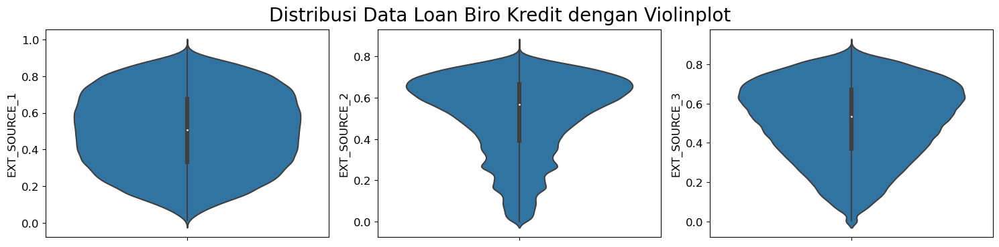

In [46]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(biro_kredit)):
    sns.violinplot(y = train[biro_kredit[i]], ax = fig.add_subplot(math.ceil(len(loan_app)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = biro_kredit[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan Biro Kredit dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Loan Biro Kredit dengan Boxplot')

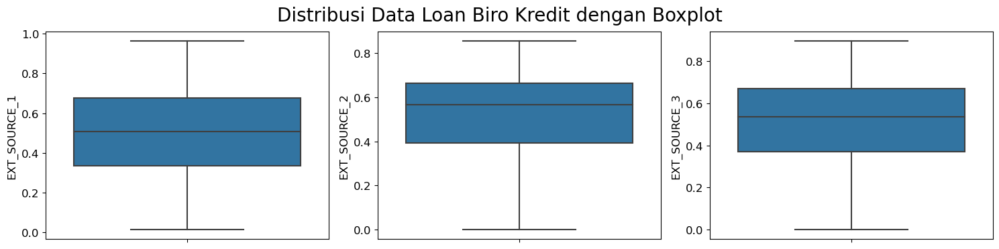

In [47]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(biro_kredit)):
    sns.boxplot(y = train[biro_kredit[i]], ax = fig.add_subplot(math.ceil(len(loan_app)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = biro_kredit[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Loan Biro Kredit dengan Boxplot", fontsize=20, y=1.02)

Kesimpulan :
- Kolom biro kredit berisi informasi seputar biro kredit (eksternal) dengan 3  kolom numerik dan 1 kolom target 
- Terdapat missing value pada ketiga kolom dengan persentase `EXT_SOURCE_1` = 46 %, `EXT_SOURCE_2` = 0.18%, `EXT_SOURCE_3` = 16%
- Tidak terdapat Outlier di ketiga kolom
- Tidak terdapat positively skewed(dilihat dari perbedaan antara mean dan median) dan cenderung simetris pada ketiga kolom 

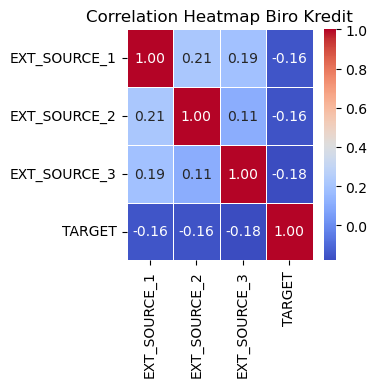

In [52]:
plt.figure(figsize=(3, 3))
biro_kredit_corr = train[biro_kredit].corr()
sns.heatmap(biro_kredit_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Biro Kredit')
plt.show()

Kesimpulan:
- semua kolom dari data biro kredit yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `EXT_SOURCE_3` dengan nilai -0.18

In [53]:
train[properti_avg].describe()

,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,TARGET
count,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,307511.000000
mean,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.080729
std,0.10824,0.082438,0.059223,0.113280,0.076036,0.134576,0.100049,0.144641,0.161380,0.081184,0.092576,0.110565,0.047732,0.069523,0.272419
min,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.05770,0.044200,0.976700,0.687200,0.007800,0.000000,0.069000,0.166700,0.083300,0.018700,0.050400,0.045300,0.000000,0.000000,0.000000
50%,0.08760,0.076300,0.981600,0.755200,0.021100,0.000000,0.137900,0.166700,0.208300,0.048100,0.075600,0.074500,0.000000,0.003600,0.000000
75%,0.14850,0.112200,0.986600,0.823200,0.051500,0.120000,0.206900,0.333300,0.375000,0.085600,0.121000,0.129900,0.003900,0.027700,0.000000
max,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [55]:
train[properti_avg].isna().sum() / train[properti_avg].size * 100

APARTMENTS_AVG                 3.383315
BASEMENTAREA_AVG               3.901064
YEARS_BEGINEXPLUATATION_AVG    3.252068
YEARS_BUILD_AVG                4.433186
COMMONAREA_AVG                 4.658153
ELEVATORS_AVG                  3.553065
ENTRANCES_AVG                  3.356585
FLOORSMAX_AVG                  3.317388
FLOORSMIN_AVG                  4.523242
LANDAREA_AVG                   3.958449
LIVINGAPARTMENTS_AVG           4.556997
LIVINGAREA_AVG                 3.346222
NONLIVINGAPARTMENTS_AVG        4.628864
NONLIVINGAREA_AVG              3.678611
TARGET                         0.000000
dtype: float64

Text(0.5, 1.02, 'Distribusi Data Properti (AVG) dengan Violinplot')

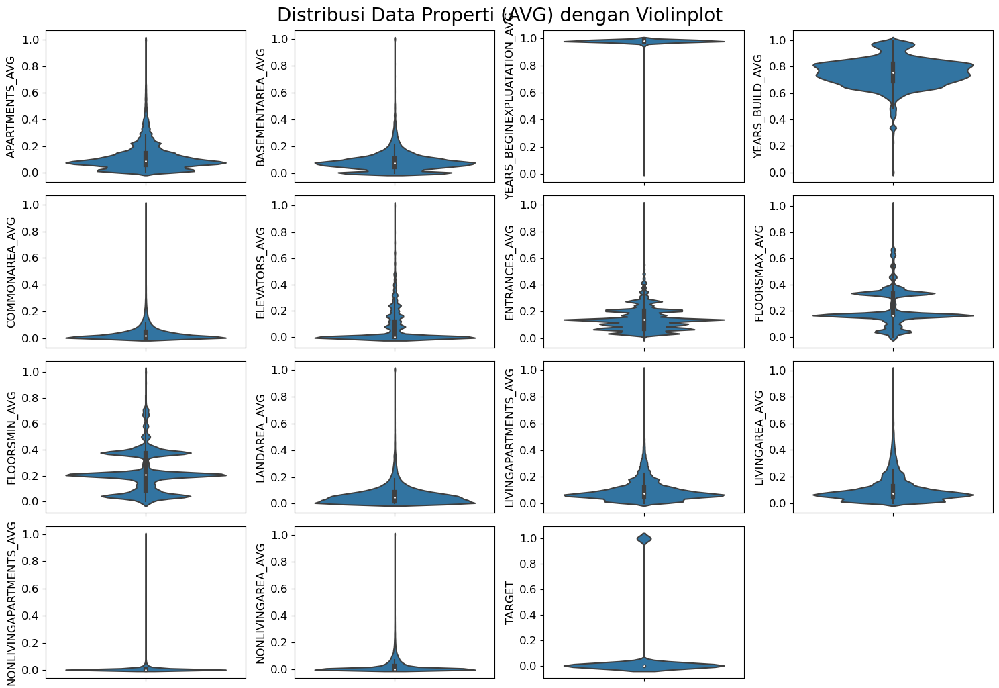

In [116]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_avg)):
    sns.violinplot(y = train[properti_avg[i]], ax = fig.add_subplot(math.ceil(len(properti_avg)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_avg[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (AVG) dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Properti (AVG) dengan Boxplot')

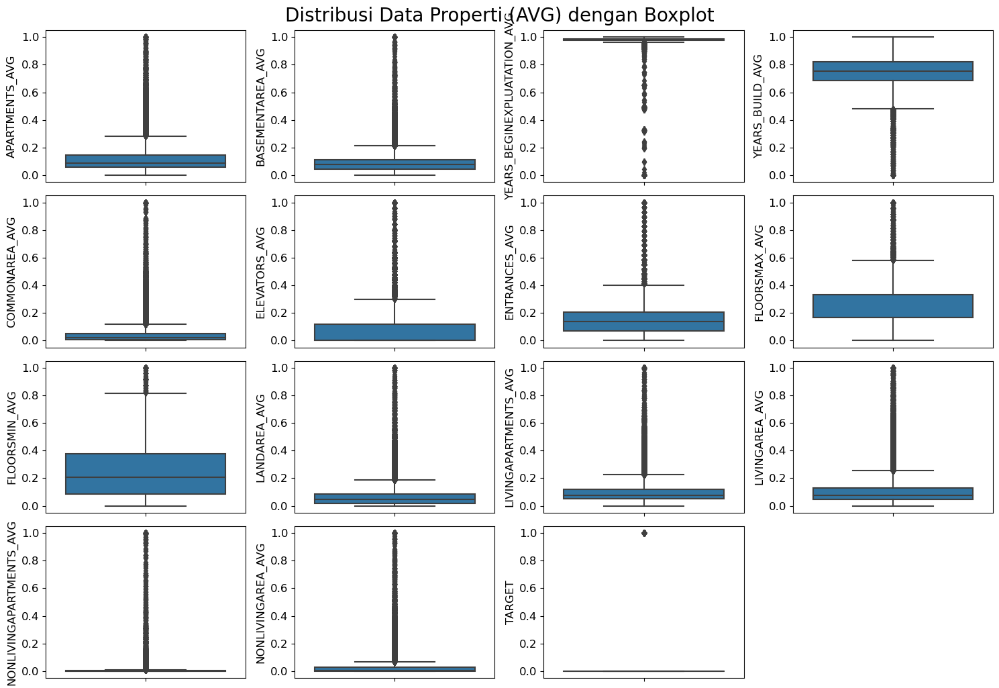

In [59]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_avg)):
    sns.boxplot(y = train[properti_avg[i]], ax = fig.add_subplot(math.ceil(len(properti_avg)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_avg[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (AVG) dengan Boxplot", fontsize=20, y=1.02)

Kesimpulan :
- Kolom kategori properti_avg berisi informasi seputar properti yang mwakili nilai rata-rata dengan 14 kolom numerik dan 1 kolom target 
- Terdapat missing value pada semua kolom kategori ini kecuali kolom target yang kebanyakan diantaranya dengan persentase 3-4%
- Terdapat Outlier di 14 kolom diantaranya yaitu semua kolom kecuali kolom `TARGET`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom diantaranya yakni `APARTMENTS_AVG`,`BASEMENTAREA_AVG`, `COMMONAREA_AVG `, `ELEVATORS_AVG `, `ENTRANCES_AVG  `, `FLOORSMAX_AVG `, `FLOORSMIN_AVG  `, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`
- Terdapat Negatively skewed pada 2 kolom diantaranya yakni `YEARS_BEGINEXPLUATATION_AVG`,`YEARS_BUILD_AVG`

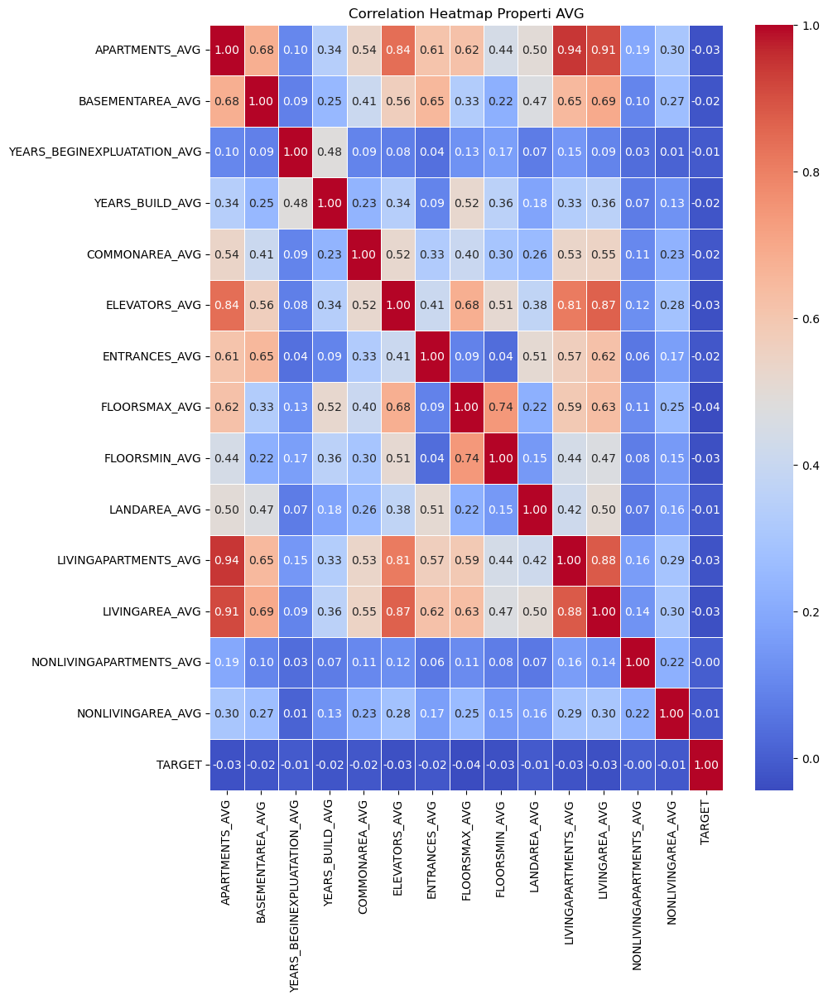

In [60]:
plt.figure(figsize=(10, 12))
properti_avg_corr = train[properti_avg].corr()
sns.heatmap(properti_avg_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Properti AVG')
plt.show()

Kesimpulan:
- semua kolom dari data properti_avg yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `FLOORSMAX_AVG` dengan nilai -0.04

In [62]:
train[properti_medi].describe()

,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TARGET
count,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,307511.000000
mean,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.080729
std,0.109076,0.082179,0.059897,0.112066,0.076144,0.134467,0.100368,0.145067,0.161934,0.082167,0.093642,0.112260,0.047415,0.070166,0.272419
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.058300,0.043700,0.976700,0.691400,0.007900,0.000000,0.069000,0.166700,0.083300,0.018700,0.051300,0.045700,0.000000,0.000000,0.000000
50%,0.086400,0.075800,0.981600,0.758500,0.020800,0.000000,0.137900,0.166700,0.208300,0.048700,0.076100,0.074900,0.000000,0.003100,0.000000
75%,0.148900,0.111600,0.986600,0.825600,0.051300,0.120000,0.206900,0.333300,0.375000,0.086800,0.123100,0.130300,0.003900,0.026600,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [63]:
train[properti_medi].isna().sum() / train[properti_medi].size * 100

APARTMENTS_MEDI                 3.383315
BASEMENTAREA_MEDI               3.901064
YEARS_BEGINEXPLUATATION_MEDI    3.252068
YEARS_BUILD_MEDI                4.433186
COMMONAREA_MEDI                 4.658153
ELEVATORS_MEDI                  3.553065
ENTRANCES_MEDI                  3.356585
FLOORSMAX_MEDI                  3.317388
FLOORSMIN_MEDI                  4.523242
LANDAREA_MEDI                   3.958449
LIVINGAPARTMENTS_MEDI           4.556997
LIVINGAREA_MEDI                 3.346222
NONLIVINGAPARTMENTS_MEDI        4.628864
NONLIVINGAREA_MEDI              3.678611
TARGET                          0.000000
dtype: float64

Kesimpulan :
- Kolom kategori properti_mode berisi informasi seputar properti yang mwakili median dengan 14 kolom numerik dan 1 kolom target 
- Terdapat missing value pada semua kolom kategori ini kecuali kolom target yang kebanyakan diantaranya dengan persentase 3-4%
- Terdapat Outlier di 14 kolom diantaranya yaitu semua kolom kecuali kolom `TARGET`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom diantaranya yakni `APARTMENTS_AVG`,`BASEMENTAREA_AVG`, `COMMONAREA_AVG `, `ELEVATORS_AVG `, `ENTRANCES_AVG  `, `FLOORSMAX_AVG `, `FLOORSMIN_AVG  `, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`
- Terdapat Negatively skewed pada 2 kolom diantaranya yakni `YEARS_BEGINEXPLUATATION_AVG`,`YEARS_BUILD_AVG`

Text(0.5, 1.02, 'Distribusi Data Properti (Median) dengan Violinplot')

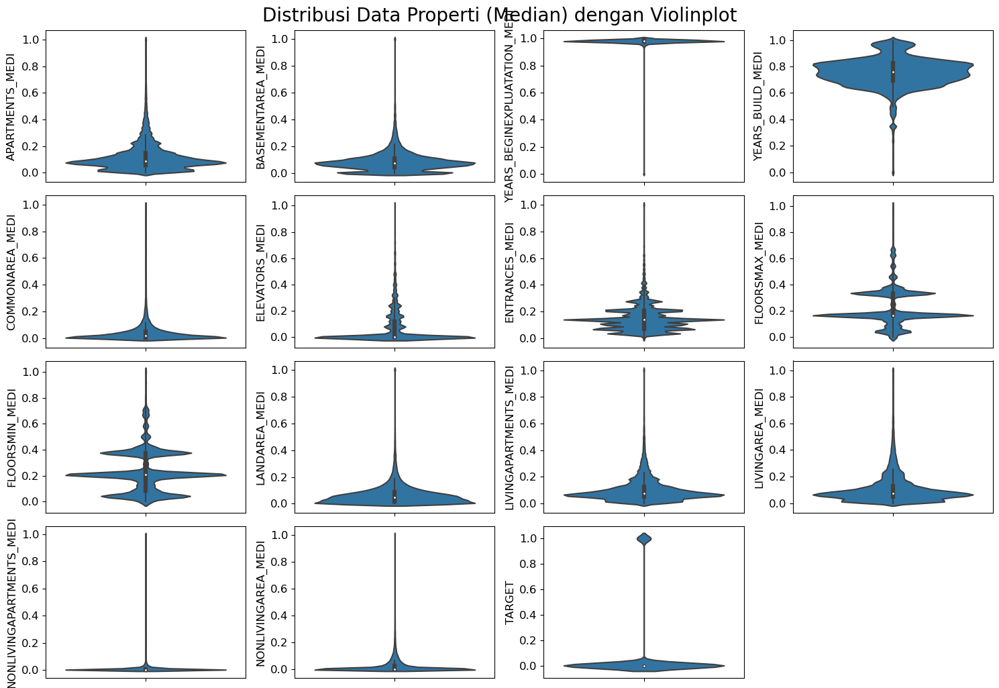

In [64]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_medi)):
    sns.violinplot(y = train[properti_medi[i]], ax = fig.add_subplot(math.ceil(len(properti_medi)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_medi[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (Median) dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Properti (Median) dengan Boxplot')

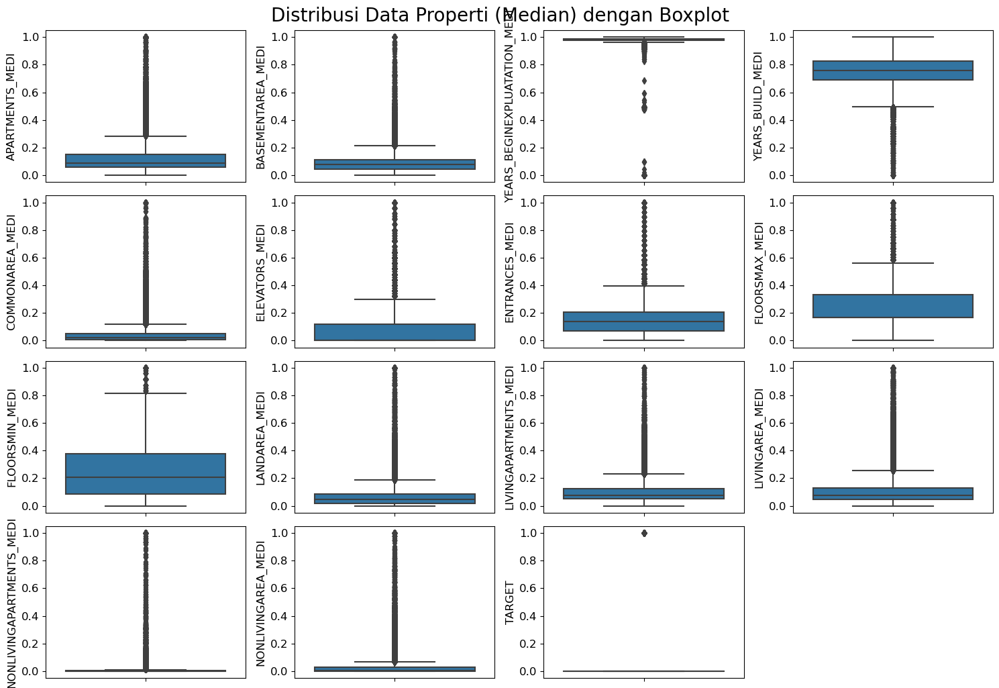

In [65]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_medi)):
    sns.boxplot(y = train[properti_medi[i]], ax = fig.add_subplot(math.ceil(len(properti_medi)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_medi[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (Median) dengan Boxplot", fontsize=20, y=1.02)

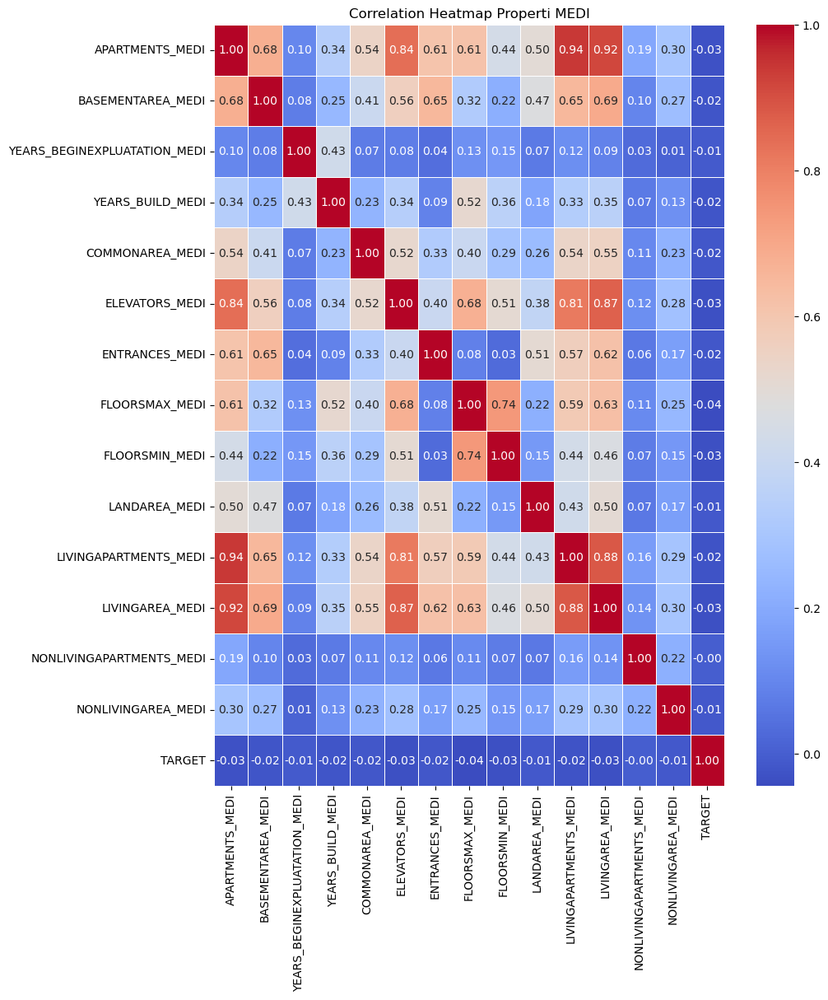

In [167]:
plt.figure(figsize=(10, 12))
properti_medi_corr = properti_medi.corr()
sns.heatmap(properti_medi_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Properti MEDI')
plt.show()

Kesimpulan:
- semua kolom dari data properti_medi yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `FLOORSMAX_MEDI` dengan nilai -0.04

### Properti_mode

In [67]:
train[properti_mode].describe()

,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,TOTALAREA_MODE,TARGET
count,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,307511.000000
mean,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.102547,0.080729
std,0.107936,0.084307,0.064575,0.110111,0.074445,0.132256,0.100977,0.143709,0.161160,0.081750,0.097880,0.111845,0.046276,0.070254,0.107462,0.272419
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.052500,0.040700,0.976700,0.699400,0.007200,0.000000,0.069000,0.166700,0.083300,0.016600,0.054200,0.042700,0.000000,0.000000,0.041200,0.000000
50%,0.084000,0.074600,0.981600,0.764800,0.019000,0.000000,0.137900,0.166700,0.208300,0.045800,0.077100,0.073100,0.000000,0.001100,0.068800,0.000000
75%,0.143900,0.112400,0.986600,0.823600,0.049000,0.120800,0.206900,0.333300,0.375000,0.084100,0.131300,0.125200,0.003900,0.023100,0.127600,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [27]:
train[properti_mode].isna().sum() / train.size* 100

APARTMENTS_MODE                 0.415981
BASEMENTAREA_MODE               0.479639
YEARS_BEGINEXPLUATATION_MODE    0.399844
YEARS_BUILD_MODE                0.545064
COMMONAREA_MODE                 0.572724
ELEVATORS_MODE                  0.436852
ENTRANCES_MODE                  0.412695
FLOORSMAX_MODE                  0.407876
FLOORSMIN_MODE                  0.556136
LANDAREA_MODE                   0.486695
LIVINGAPARTMENTS_MODE           0.560287
LIVINGAREA_MODE                 0.411421
NONLIVINGAPARTMENTS_MODE        0.569123
NONLIVINGAREA_MODE              0.452288
TOTALAREA_MODE                  0.395644
TARGET                          0.000000
dtype: float64

Kesimpulan :
- Kolom kategori properti_mode berisi informasi seputar properti yang mewakili nilai modus dengan 15 kolom numerik dan 1 kolom target 
- Terdapat missing value pada semua kolom kategori ini kecuali kolom target yang kebanyakan diantaranya dengan persentase 39% - 57%
- Terdapat Outlier di 15 kolom diantaranya yaitu semua kolom kecuali kolom `TARGET`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom diantaranya yakni `APARTMENTS_AVG`,`BASEMENTAREA_AVG`, `COMMONAREA_AVG `, `ELEVATORS_AVG `, `ENTRANCES_AVG  `, `FLOORSMAX_AVG `, `FLOORSMIN_AVG  `, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`, `TOTALAREA_MODE`
- Terdapat Negatively skewed pada 2 kolom diantaranya yakni `YEARS_BEGINEXPLUATATION_AVG`,`YEARS_BUILD_AVG`

Text(0.5, 1.02, 'Distribusi Data Properti (Mode) dengan Violinplot')

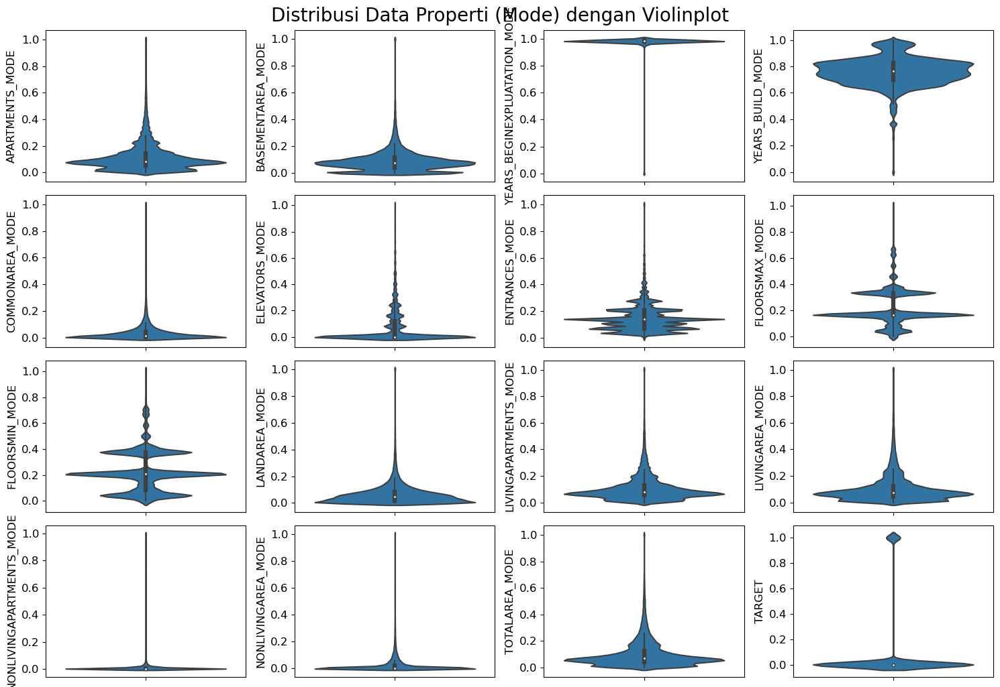

In [70]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_mode)):
    sns.violinplot(y = train[properti_mode[i]], ax = fig.add_subplot(math.ceil(len(properti_mode)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_mode[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (Mode) dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Properti (Mode) dengan Boxplot')

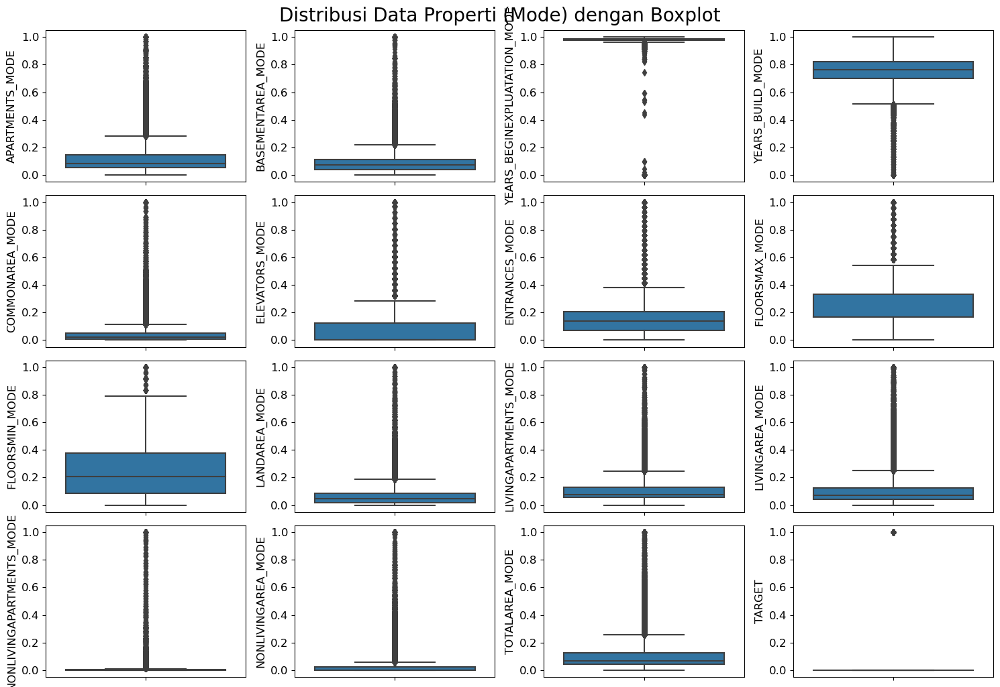

In [73]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(properti_mode)):
    sns.boxplot(y = train[properti_mode[i]], ax = fig.add_subplot(math.ceil(len(properti_mode)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = properti_mode[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Properti (Mode) dengan Boxplot", fontsize=20, y=1.02)

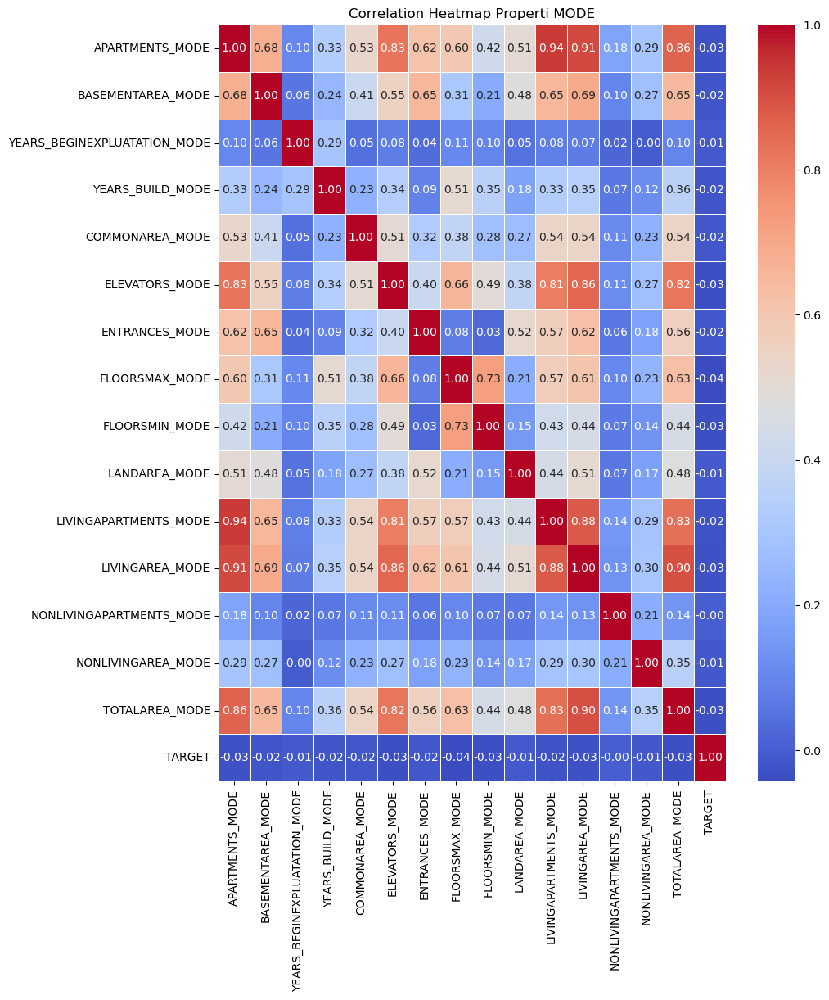

In [74]:
plt.figure(figsize=(10, 12))
properti_mode_corr = train[properti_mode].corr()
sns.heatmap(properti_mode_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Properti MODE')
plt.show()

Kesimpulan:
- semua kolom dari data properti_mode yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `FLOORSMAX_MODE` dengan nilai -0.04

### Behavior

In [37]:
train[behavior].describe()

,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TARGET
count,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,307511.000000
mean,1.422245,0.143421,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974,0.080729
std,2.400989,0.446698,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295,0.272419
min,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,2.000000,0.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000
max,348.000000,34.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000,1.000000


Kesimpulan :
- Kolom kategori behavior berisi informasi seputar perilaku peminjam terkait aktivitas sosial dan kredit mereka dengan 10 kolom numerik dan 1 kolom target 
- Terdapat missing value pada semua kolom kategori ini kecuali kolom target yang kebanyakan diantaranya dengan persentase 0.02 untuk kolom `OBS_30_CNT_SOCIAL_CIRCLE`, `DEF_30_CNT_SOCIAL_CIRCLE`,`DEF_60_CNT_SOCIAL_CIRCLE`,`DAYS_LAST_PHONE_CHANGE `, dan sisanya dengan persentase 11 %
- Terdapat Outlier di 10 kolom diantaranya yaitu semua kolom kecuali kolom `TARGET`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom diantaranya yakni `OBS_30_CNT_SOCIAL_CIRCLE`,`DEF_30_CNT_SOCIAL_CIRCLE`, `DEF_60_CNT_SOCIAL_CIRCLE  `, `AMT_REQ_CREDIT_BUREAU_HOUR`, `AMT_REQ_CREDIT_BUREAU_DAY `, `AMT_REQ_CREDIT_BUREAU_WEEK`, `AMT_REQ_CREDIT_BUREAU_MON`, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`, `AMT_REQ_CREDIT_BUREAU_QRT`,`AMT_REQ_CREDIT_BUREAU_YEAR`
- Terdapat Negatively skewed pada  kolom diantaranya yakni `DAYS_LAST_PHONE_CHANGE`

In [28]:
train[behavior].isna().sum() /train.size * 100

OBS_30_CNT_SOCIAL_CIRCLE      0.002721
DEF_30_CNT_SOCIAL_CIRCLE      0.002721
DEF_60_CNT_SOCIAL_CIRCLE      0.002721
DAYS_LAST_PHONE_CHANGE        0.000003
AMT_REQ_CREDIT_BUREAU_HOUR    0.110669
AMT_REQ_CREDIT_BUREAU_DAY     0.110669
AMT_REQ_CREDIT_BUREAU_WEEK    0.110669
AMT_REQ_CREDIT_BUREAU_MON     0.110669
AMT_REQ_CREDIT_BUREAU_QRT     0.110669
AMT_REQ_CREDIT_BUREAU_YEAR    0.110669
TARGET                        0.000000
dtype: float64

In [38]:
train[behavior].isna().sum()

OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
TARGET                            0
dtype: int64

In [29]:
train.size 

37516342

Text(0.5, 1.02, 'Distribusi Data Perilaku Peminjam dengan Violinplot')

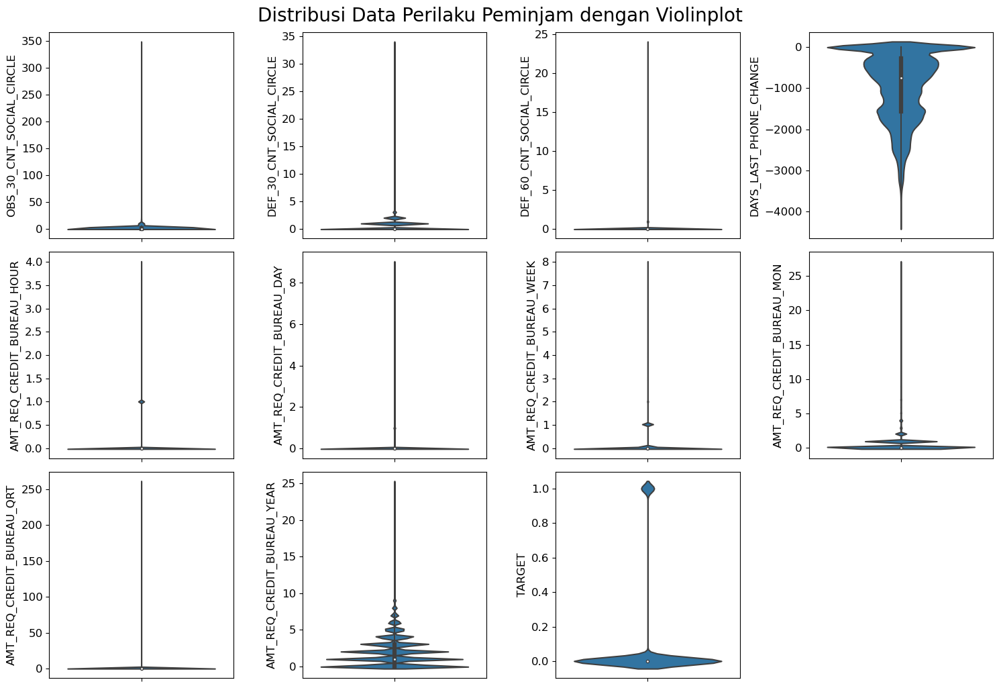

In [83]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(behavior)):
    sns.violinplot(y = train[behavior[i]], ax = fig.add_subplot(math.ceil(len(behavior)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = behavior[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Perilaku Peminjam dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Perilaku Peminjam dengan Violinplot')

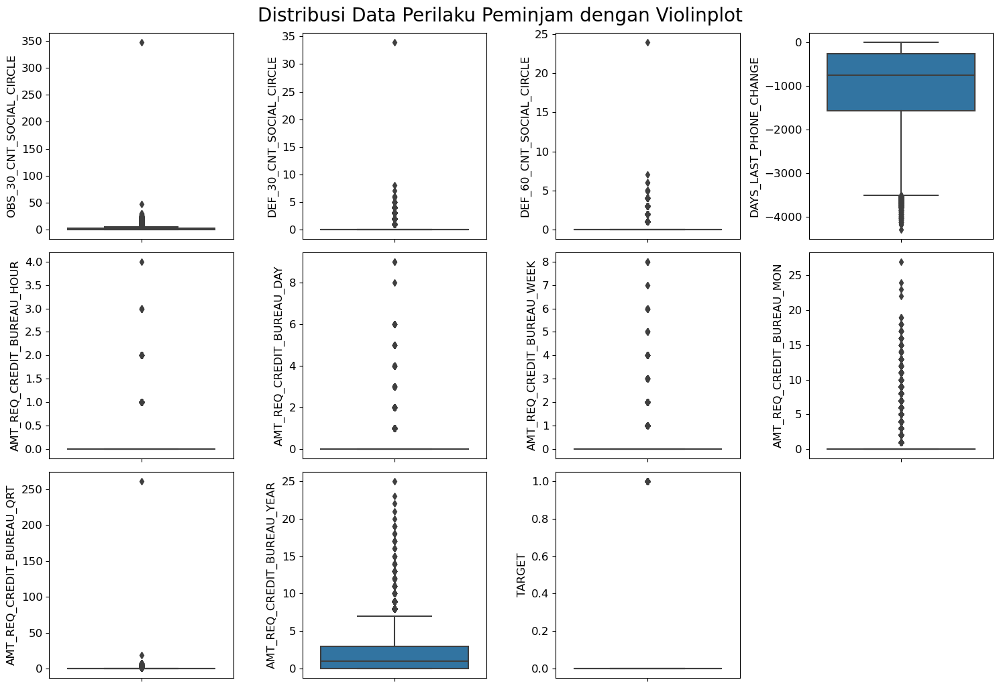

In [84]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(behavior)):
    sns.boxplot(y = train[behavior[i]], ax = fig.add_subplot(math.ceil(len(behavior)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = behavior[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Perilaku Peminjam dengan Violinplot", fontsize=20, y=1.02)

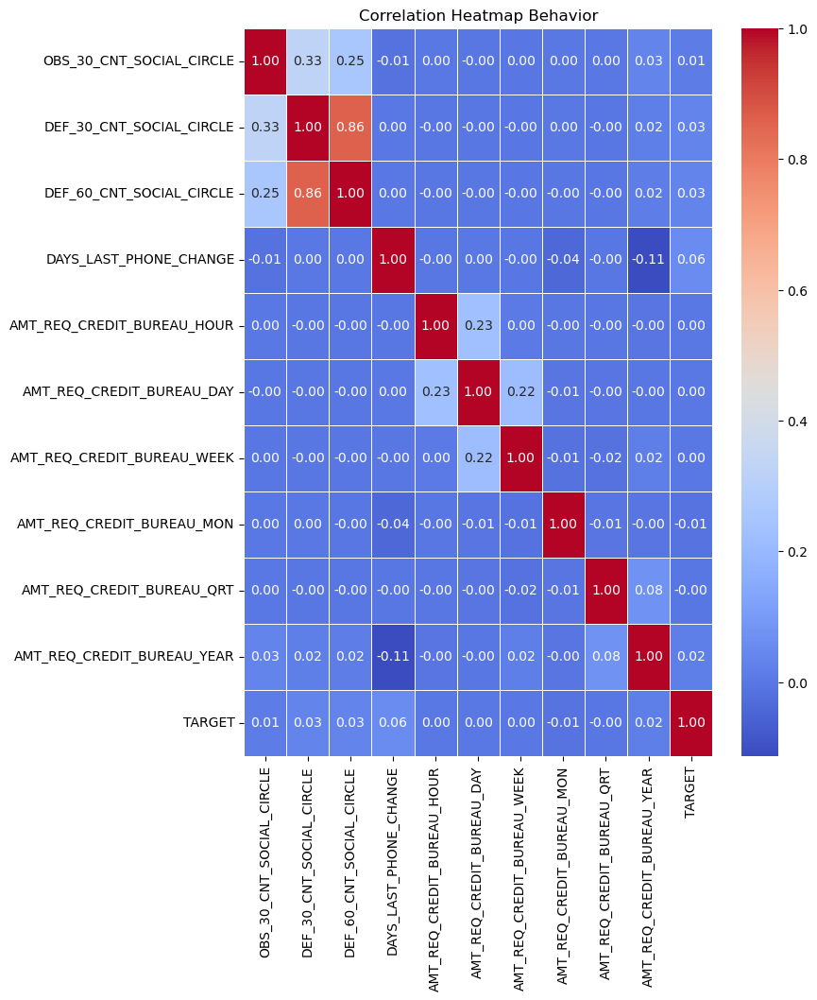

In [85]:
plt.figure(figsize=(8, 10))
behavior_corr = train[behavior].corr()
sns.heatmap(behavior_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Behavior')
plt.show()

Kesimpulan:
- semua kolom dari data behavior yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `DAYS_LAST_PHONE_CHANGE` dengan nilai 0.06

### Bukti

In [86]:
train[bukti].describe()

,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,...,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
count,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192,0.081376,0.003896,0.000023,0.003912,...,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335,0.080729
std,0.006502,0.453752,0.009016,0.122010,0.283376,0.013850,0.273412,0.062295,0.004771,0.062424,...,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299,0.272419
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [87]:
train[bukti].isna().sum()

FLAG_DOCUMENT_2     0
FLAG_DOCUMENT_3     0
FLAG_DOCUMENT_4     0
FLAG_DOCUMENT_5     0
FLAG_DOCUMENT_6     0
FLAG_DOCUMENT_7     0
FLAG_DOCUMENT_8     0
FLAG_DOCUMENT_9     0
FLAG_DOCUMENT_10    0
FLAG_DOCUMENT_11    0
FLAG_DOCUMENT_12    0
FLAG_DOCUMENT_13    0
FLAG_DOCUMENT_14    0
FLAG_DOCUMENT_15    0
FLAG_DOCUMENT_16    0
FLAG_DOCUMENT_17    0
FLAG_DOCUMENT_18    0
FLAG_DOCUMENT_19    0
FLAG_DOCUMENT_20    0
FLAG_DOCUMENT_21    0
TARGET              0
dtype: int64

Kesimpulan :
- Kolom kategori bukti berisi informasi seputar keberadaan dokumen tertentu dengan 20 kolom numerik dan 1 kolom target 
- Tidak terdapat missing value pada semua kolom kategori ini  
- Semua kolom pada kategori ini bertipe biner.

Text(0.5, 1.02, 'Distribusi Data Bukti Dokumen dengan Violinplot')

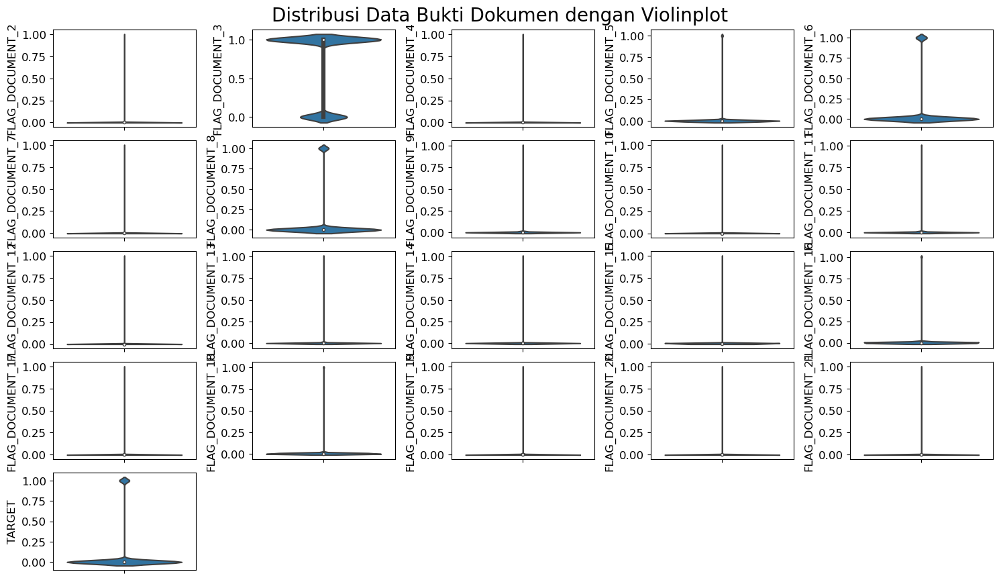

In [93]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(bukti)):
    sns.violinplot(y = train[bukti[i]], ax = fig.add_subplot(math.ceil(len(bukti)/4),5, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = bukti[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Bukti Dokumen dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Bukti Dokumen dengan Boxplot')

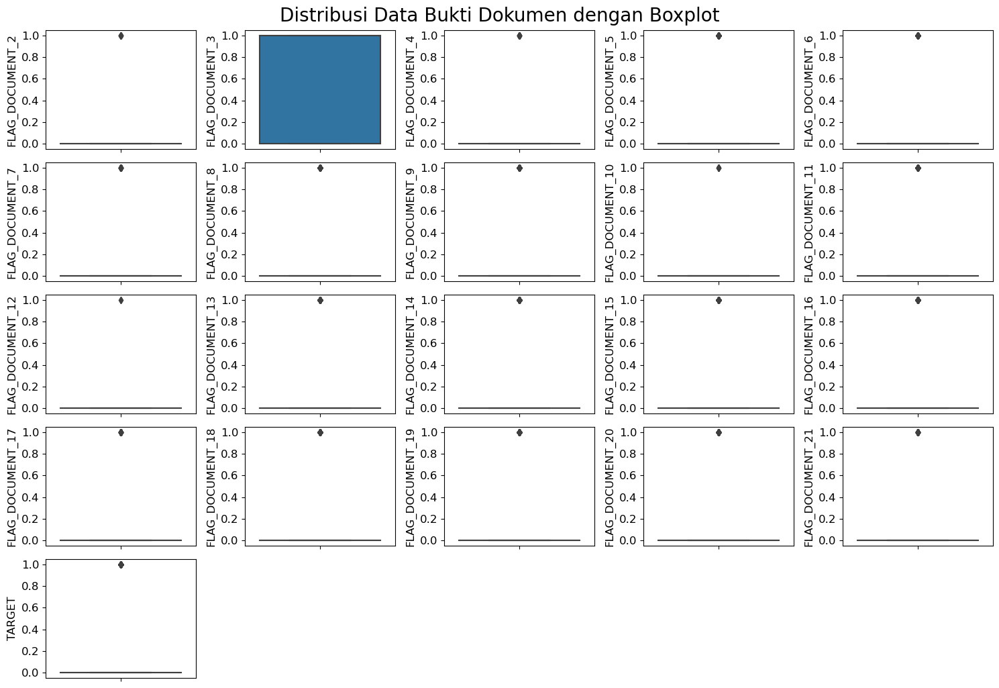

In [95]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(bukti)):
    sns.boxplot(y = train[bukti[i]], ax = fig.add_subplot(math.ceil(len(bukti)/5),5, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = bukti[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Bukti Dokumen dengan Boxplot", fontsize=20, y=1.02)

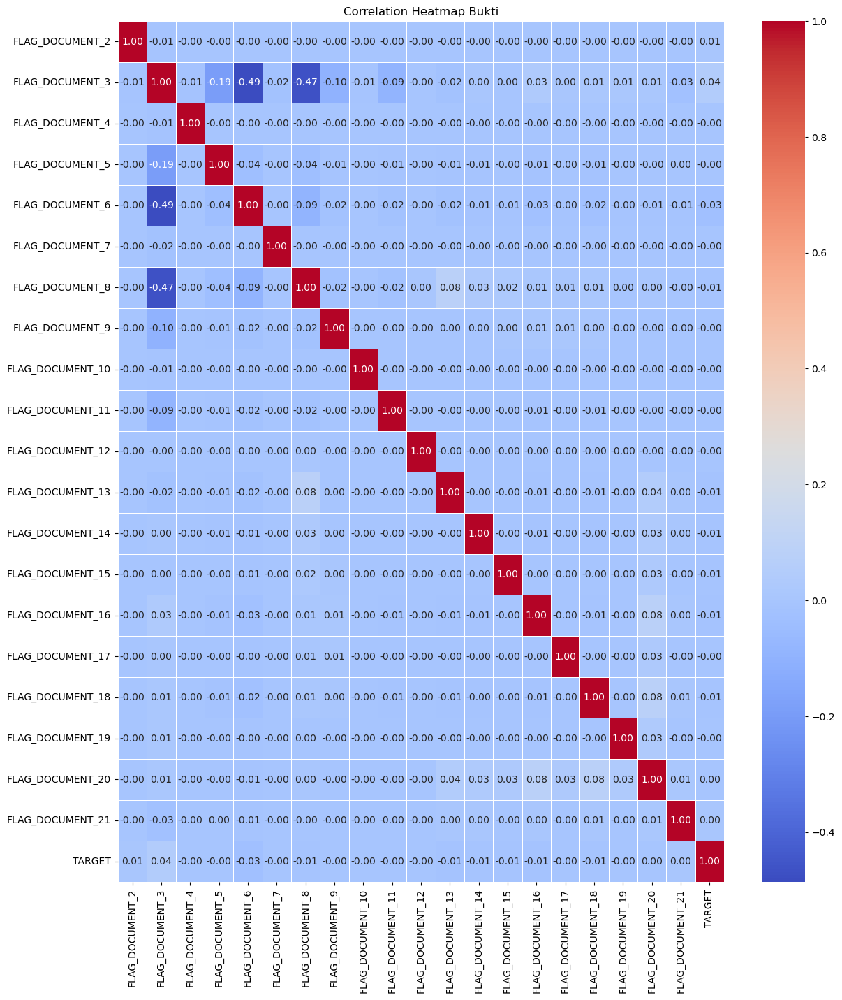

In [98]:
plt.figure(figsize=(14, 16))
bukti_corr = train[bukti].corr()
sns.heatmap(bukti_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Bukti')
plt.show()

Kesimpulan:
- semua kolom dari data bukti yang berkorelasi dengan kolom target tidak memiliki korelasi yang lebih tinggi dari 0.5
adapun korelasi paling tinggi dengan target yakni kolom `FLAG_DOCUMENT_6` dengan nilai -0.03

In [33]:
cats.describe()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [36]:
cats.isna().sum()

NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
OCCUPATION_TYPE                96391
WEEKDAY_APPR_PROCESS_START         0
ORGANIZATION_TYPE                  0
FONDKAPREMONT_MODE            210295
HOUSETYPE_MODE                154297
WALLSMATERIAL_MODE            156341
EMERGENCYSTATE_MODE           145755
TARGET                             0
dtype: int64

In [48]:
cats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 17 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   NAME_CONTRACT_TYPE          307511 non-null  object
 1   CODE_GENDER                 307511 non-null  object
 2   FLAG_OWN_CAR                307511 non-null  object
 3   FLAG_OWN_REALTY             307511 non-null  object
 4   NAME_TYPE_SUITE             306219 non-null  object
 5   NAME_INCOME_TYPE            307511 non-null  object
 6   NAME_EDUCATION_TYPE         307511 non-null  object
 7   NAME_FAMILY_STATUS          307511 non-null  object
 8   NAME_HOUSING_TYPE           307511 non-null  object
 9   OCCUPATION_TYPE             211120 non-null  object
 10  WEEKDAY_APPR_PROCESS_START  307511 non-null  object
 11  ORGANIZATION_TYPE           307511 non-null  object
 12  FONDKAPREMONT_MODE          97216 non-null   object
 13  HOUSETYPE_MODE              1

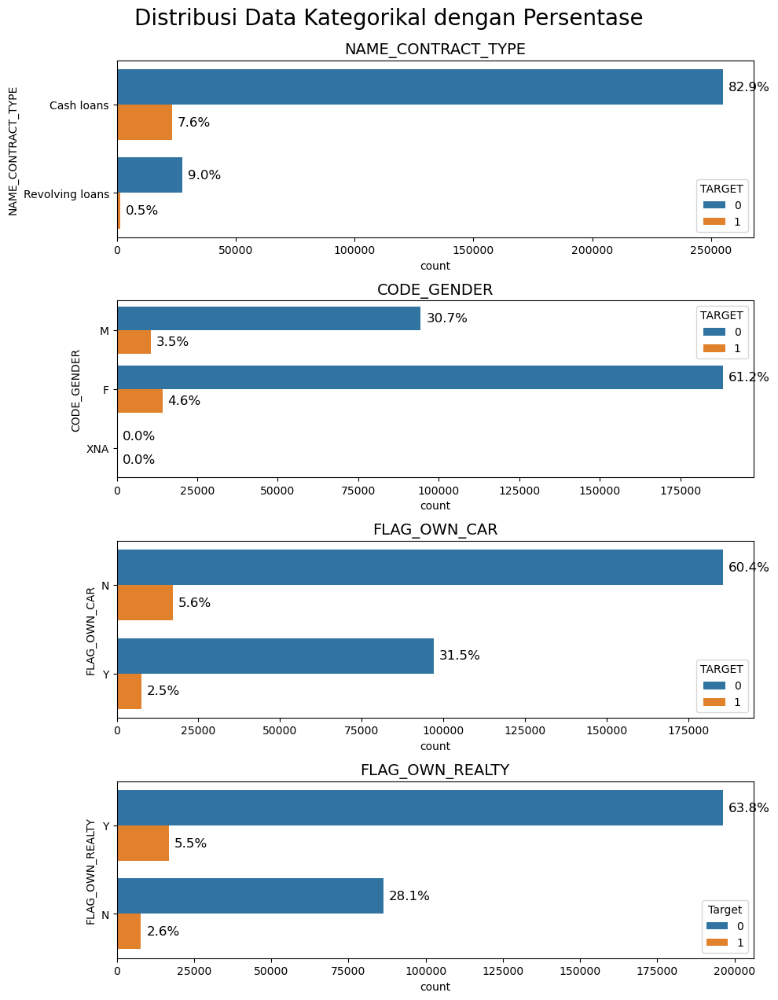

In [109]:
plt.figure(figsize=(10, 15))
for i, column in enumerate(cats[:4]):  
    sns.countplot(data=train, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(train[column])
    
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                    textcoords='offset points')
    
    plt.title(f"{column}", fontsize=14)

plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()

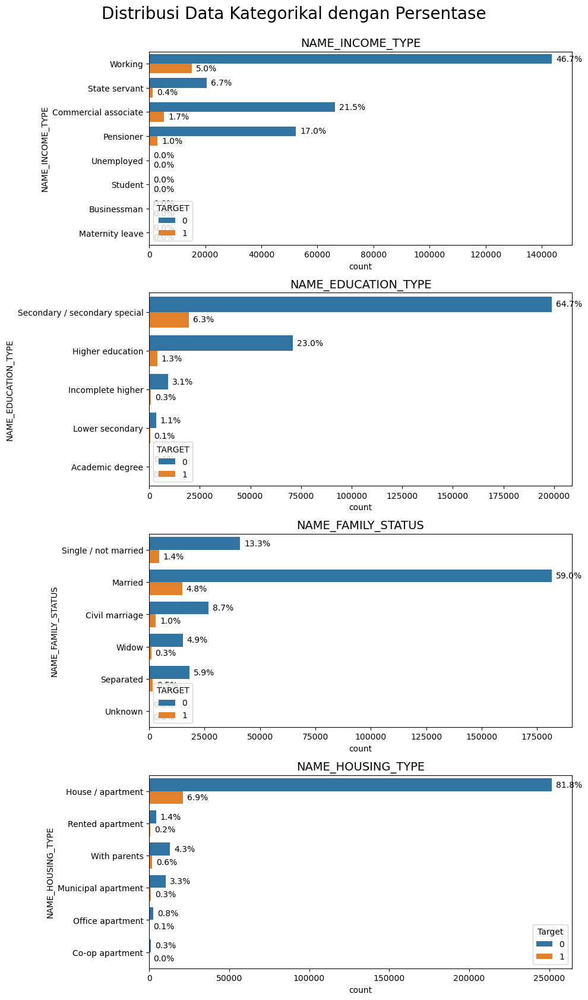

In [112]:
plt.figure(figsize=(10, 20))
for i, column in enumerate(cats[5:9]):  
    plt.subplot(5, 1, 1+i)
    sns.countplot(data=train, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(train[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=14)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="lower right")
plt.show()


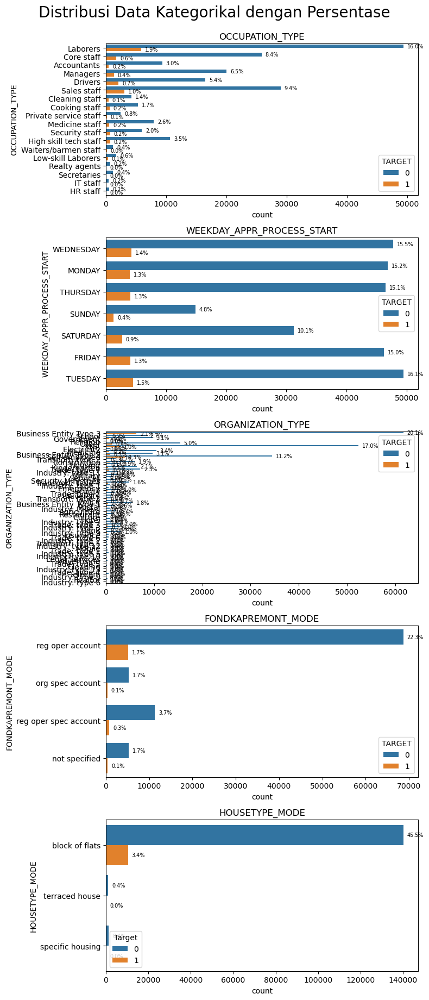

In [114]:
plt.figure(figsize=(8, 18))
for i, column in enumerate(cats[9:14]):  
    plt.subplot(5, 1, 1+i)
    sns.countplot(data=train, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(train[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=7, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()


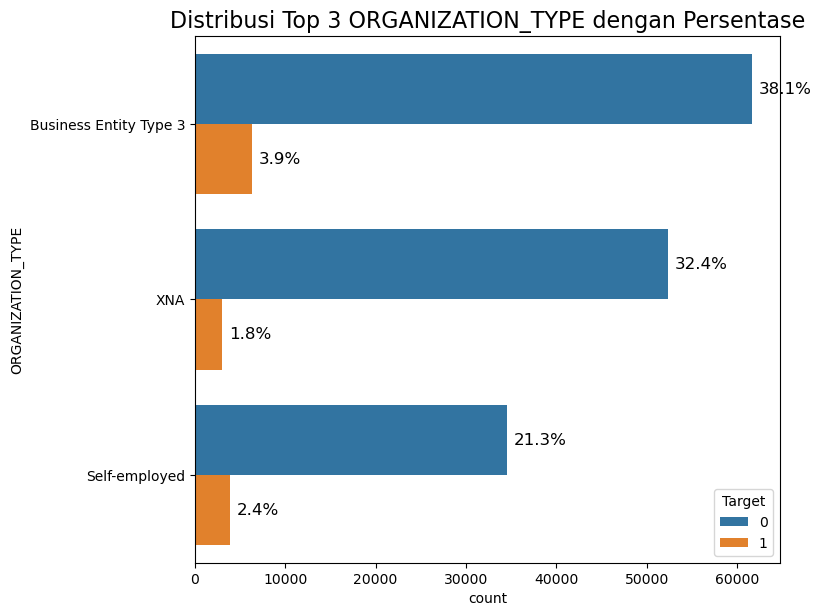

In [119]:
plt.figure(figsize=(8, 6))
top3_categories = train['ORGANIZATION_TYPE'].value_counts().nlargest(3).index

filtered_data = train[train['ORGANIZATION_TYPE'].isin(top3_categories)]

sns.countplot(data=filtered_data, y='ORGANIZATION_TYPE', hue='TARGET')  
plt.xticks(rotation=0)
plt.tight_layout()
ax = plt.gca()
total = len(filtered_data)

for p in ax.patches:
    percentage = f"{100 * p.get_width() / total:.1f}%"
    ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                textcoords='offset points')

plt.title(f"Distribusi Top 3 {column} dengan Persentase", fontsize=16)
plt.legend(title="Target", loc="best")
plt.show()


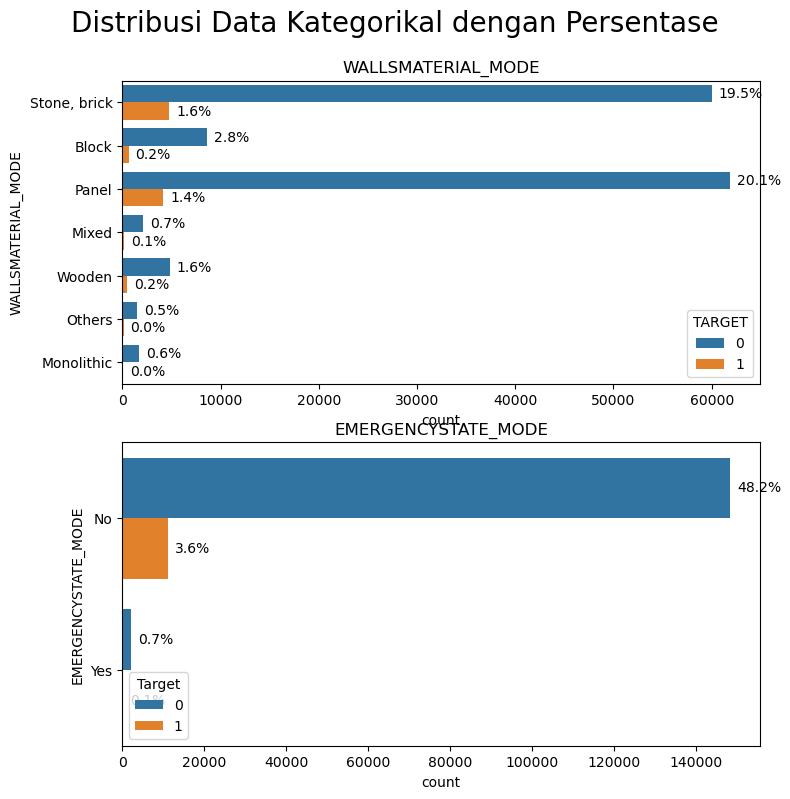

In [115]:
plt.figure(figsize=(8, 18))
for i, column in enumerate(cats[14:16]):  
    plt.subplot(5, 1, 1+i)
    sns.countplot(data=train, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(train[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()




1. `NAME_CONTRACT_TYPE` = CASH_LOANS (y=7.6%)
2. `NAME_HOUSING_TYPE` = House/Apartment (6.9%)
3. `NAME_EDUCATION_TYPE` = Secondary/secondary special (y=6.3%)
4. `NAME_CONTRACT_TYPE` = NO (y=5.6%)
5. `FLAG_OWN_CAR` = NO (y=5.6%)
6. `FLAG_OWN_REALTY` = Yes (y=5.5%)
7. `NAME_INCOME_TYPE` = Working (y=5.0%)
8. `NAME_FAMILY_STATUS` = Married (y=4.8%)
9. `CODE_GENDER` = F (y=4.6%)
10. `ORGANIZATION_TYPE` = Business Entity Type 3 (y=3.9%)
11. `EMERGENCYSTATE_MODE` = No (y=3.6%)
12. `OCCUPATION_TYPE` = Laborers (y=1.9%) 
13. `WALLS_MATERIAL_MODE` = Stone, brick (y=1.6%)
14. `WEEKDAY_APPR_PROCESS_START` = Tuesday(y=1.5%)


## Biro Data Exploration

In [154]:
biro = pd.read_csv('bureau.csv')

In [155]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
biro = pd.merge(biro, train[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')

In [142]:
biro.sample(5)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,TARGET
1506103,381082,5994223,Active,currency 1,-447,0,27281.0,NaN,0.000,0,180000.0,179272.89,727.11,0.0,Credit card,-22,4500.0,0.0
380690,161881,5176313,Closed,currency 1,-2383,0,-2198.0,-2195.0,NaN,0,15043.5,0.00,NaN,0.0,Consumer credit,-447,NaN,0.0
388689,204473,5185996,Active,currency 1,-20,0,100.0,NaN,NaN,0,66303.0,NaN,NaN,0.0,Consumer credit,-5,16434.0,0.0
1042633,255618,6430394,Closed,currency 1,-2130,0,-1948.0,-1172.0,NaN,0,41625.0,NaN,NaN,0.0,Consumer credit,-1169,0.0,0.0
1093927,279140,5864587,Closed,currency 1,-859,0,-645.0,-674.0,4255.875,0,22720.5,0.00,0.00,0.0,Consumer credit,-674,NaN,0.0


In [132]:
biro.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY', 'TARGET'],
      dtype='object')

In [39]:
biro.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1716428 entries, 0 to 1716427
Data columns (total 18 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
 17  TARGET                  float64
dtypes: float64(9), int64(6), object(3)
memory usage: 248.8+ MB


In [9]:
biro.describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY,TARGET
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05,1.465325e+06
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04,7.815331e-02
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05,2.684128e-01
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04,0.000000e+00
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08,1.000000e+00


In [50]:
biro.isna().sum() / biro.size * 100

SK_ID_CURR                0.000000
SK_ID_BUREAU              0.000000
CREDIT_ACTIVE             0.000000
CREDIT_CURRENCY           0.000000
DAYS_CREDIT               0.000000
CREDIT_DAY_OVERDUE        0.000000
DAYS_CREDIT_ENDDATE       0.341643
DAYS_ENDDATE_FACT         2.050942
AMT_CREDIT_MAX_OVERDUE    3.639626
CNT_CREDIT_PROLONG        0.000000
AMT_CREDIT_SUM            0.000042
AMT_CREDIT_SUM_DEBT       0.833996
AMT_CREDIT_SUM_LIMIT      1.915412
AMT_CREDIT_SUM_OVERDUE    0.000000
CREDIT_TYPE               0.000000
DAYS_CREDIT_UPDATE        0.000000
AMT_ANNUITY               3.970749
TARGET                    0.812744
dtype: float64

In [46]:
biro.size

30895704

Kesimpulan :
- Data Biro berisi  15 kolom numerik dan 3 kolom object  dengan 1.716.428 baris
- Terdapat missing value pada 8 kolom diantaranya yaitu kolom  `DAYS_ENDDATE_FACT`,`AMT_CREDIT_MAX_OVERDUE`,`AMT_CREDIT_SUM_LIMIT`,`AMT_ANNUITY` dengan proporsi, `DAYS_CREDIT_ENDDATE`,`AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`, `TARGET` dibawah 1%
- Terdapat Outlier di 14 kolom diantaranya yaitu kolom `CREDIT_DAY_OVERDUE`,
       `DAYS_CREDIT_ENDDATE`, `DAYS_ENDDATE_FACT`, `AMT_CREDIT_MAX_OVERDUE`,
       `CNT_CREDIT_PROLONG`, `AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`,
       `AMT_CREDIT_SUM_LIMIT`, `AMT_CREDIT_SUM_OVERDUE`, `DAYS_CREDIT_UPDATE`,
       `AMT_ANNUITY`
- Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 3 kolom diantara yakni `CREDIT_DAY_OVERDUE`,`DAYS_CREDIT_ENDDATE`,`AMT_CREDIT_MAX_OVERDUE`, `CNT_CREDIT_PROLONG`, `AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`, `AMT_CREDIT_SUM_LIMIT`,`AMT_ANNUITY`
- Terdapat negatively skewed `DAYS_CREDIT`, `DAYS_ENDDATE_FACT`,`DAYS_CREDIT_UPDATE `

In [41]:
numb = ['SK_ID_CURR', 'SK_ID_BUREAU', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY', 'TARGET']
catb = ['CREDIT_ACTIVE', 'CREDIT_CURRENCY', 'CREDIT_TYPE']

Text(0.5, 1.02, 'Distribusi Data Biro dengan Violinplot')

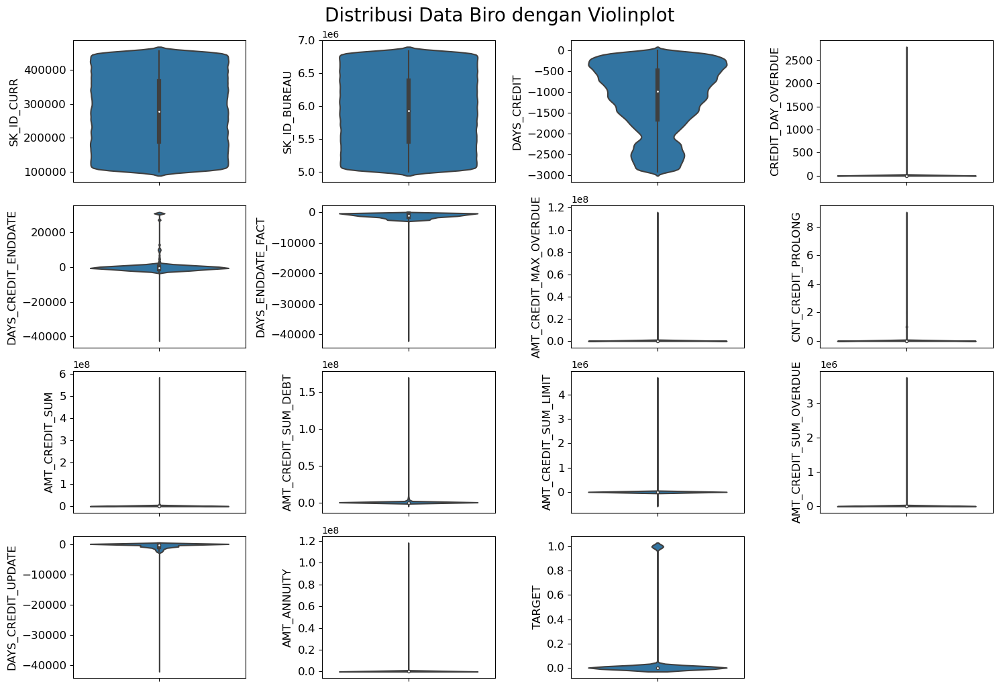

In [166]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(numb)):
    sns.violinplot(y = biro[numb[i]], ax = fig.add_subplot(math.ceil(len(numb)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = numb[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Biro dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Biro dengan Boxplot')

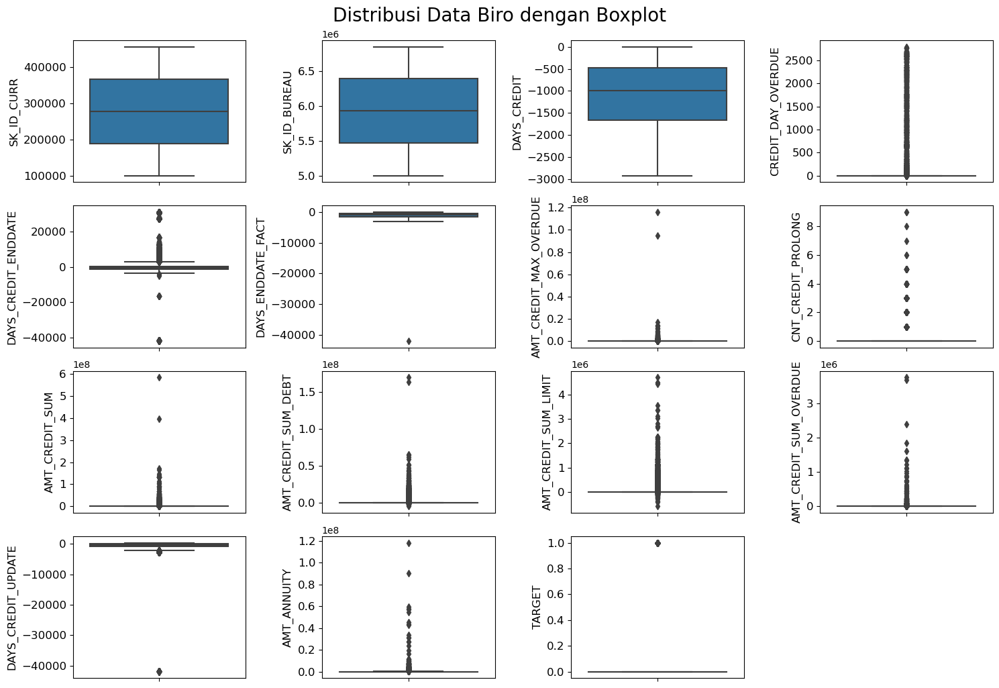

In [167]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(numb)):
    sns.boxplot(y = biro[numb[i]], ax = fig.add_subplot(math.ceil(len(numb)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = numb[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Biro dengan Boxplot", fontsize=20, y=1.02)

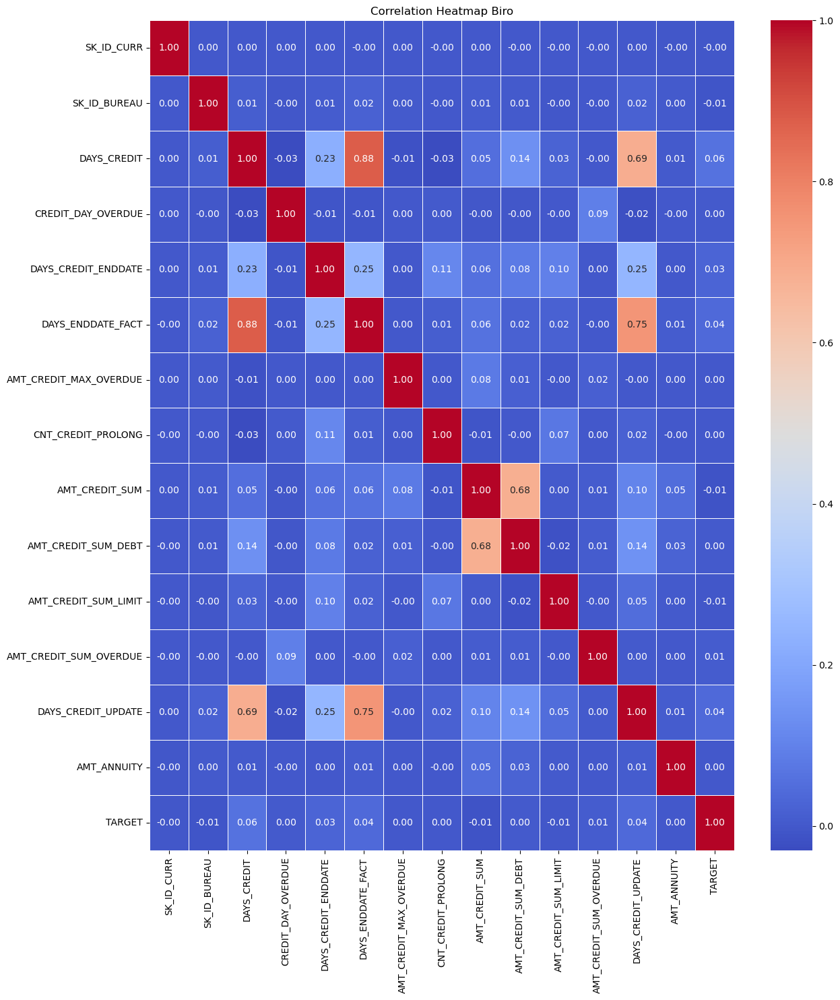

In [165]:
plt.figure(figsize=(14, 16))
biro_corr = biro.corr()
sns.heatmap(biro_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Biro')
plt.show()

Pada Data biro Kolom yang paling tinggi berkorelasi dengan kolom target yakni DAYS_CREDIT dengan nilai 0.06

In [164]:
biro[catb].describe()

,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,1716428,1716428,1716428
unique,4,4,15
top,Closed,currency 1,Consumer credit
freq,1079273,1715020,1251615


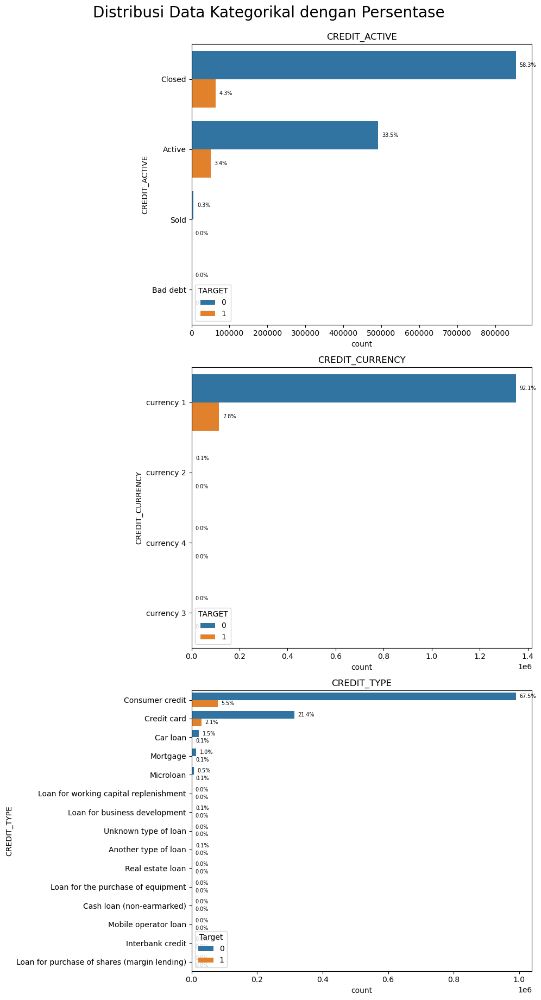

In [144]:
plt.figure(figsize=(10, 18))
for i, column in enumerate(catb):  
    plt.subplot(3, 1, 1+i)
    sns.countplot(data=bm, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(bm[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=7, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()


In [ ]:
Credit_Active = Closed (y=4.3%)
Credit_Currency = currency 1 (y=7.8%)
Credit_TYPE = Consumer Credit (y=5.5%)

## Biro Balance Data Exploration

In [156]:
biro_b = pd.read_csv('bureau_balance.csv')

In [100]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
biro_b = pd.merge(biro_b, biro[['SK_ID_BUREAU', 'TARGET']], on='SK_ID_BUREAU', how='left')

In [53]:
biro_b.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27299925 entries, 0 to 27299924
Data columns (total 4 columns):
 #   Column          Dtype  
---  ------          -----  
 0   SK_ID_BUREAU    int64  
 1   MONTHS_BALANCE  int64  
 2   STATUS          object 
 3   TARGET          float64
dtypes: float64(1), int64(2), object(1)
memory usage: 1.0+ GB


In [13]:
biro_b.describe()

,SK_ID_BUREAU,MONTHS_BALANCE,TARGET
count,2.729992e+07,2.729992e+07,1.470161e+07
mean,6.036297e+06,-3.074169e+01,6.939926e-02
std,4.923489e+05,2.386451e+01,2.541319e-01
min,5.001709e+06,-9.600000e+01,0.000000e+00
25%,5.730933e+06,-4.600000e+01,0.000000e+00
50%,6.070821e+06,-2.500000e+01,0.000000e+00
75%,6.431951e+06,-1.100000e+01,0.000000e+00
max,6.842888e+06,0.000000e+00,1.000000e+00


In [134]:
biro_b.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS', 'TARGET'], dtype='object')

In [57]:
biro_b.isna().sum() / biro_b.shape[0]* 100

SK_ID_BUREAU       0.000000
MONTHS_BALANCE     0.000000
STATUS             0.000000
TARGET            46.147793
dtype: float64

In [51]:
biro_b.isna().sum()

SK_ID_BUREAU             0
MONTHS_BALANCE           0
STATUS                   0
TARGET            12598313
dtype: int64

In [56]:
biro_b.shape

(27299925, 4)

In [46]:
catbb = ['STATUS']
numbb = ['SK_ID_BUREAU', 'MONTHS_BALANCE']

In [10]:
biro_b[numbb].describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


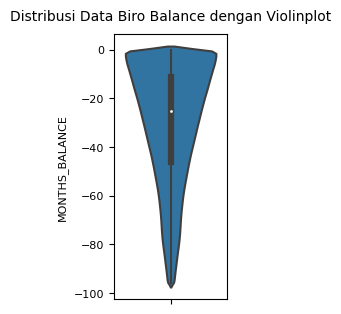

In [22]:
plt.figure(figsize=(2, 3))
sns.violinplot(y="MONTHS_BALANCE", data=biro_b)
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.ylabel(ylabel = 'MONTHS_BALANCE', fontsize=8)
plt.tight_layout()
plt.title("Distribusi Data Biro Balance dengan Violinplot", fontsize=10, y=1.02)
plt.show()

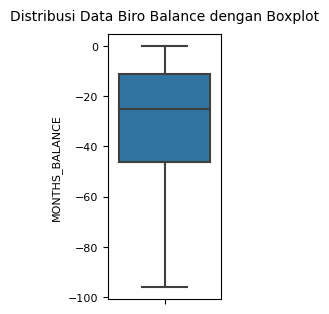

In [21]:
plt.figure(figsize=(2, 3))
sns.boxplot(y="MONTHS_BALANCE", data=biro_b)
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.ylabel(ylabel = 'MONTHS_BALANCE', fontsize=8)
plt.tight_layout()
plt.title("Distribusi Data Biro Balance dengan Boxplot", fontsize=10, y=1.02)
plt.show()

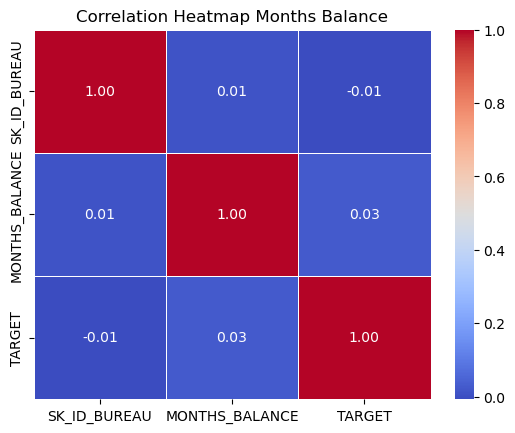

In [99]:
bb_corr = biro_b.corr()
sns.heatmap(bb_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Months Balance')
plt.show()

Pada Data biro balance Kolom yang paling tinggi berkorelasi dengan kolom target yakni MONTHS_BALANCE dengan nilai 0.03

In [113]:
catbb.describe()

,STATUS
count,27299925
unique,8
top,C
freq,13646993


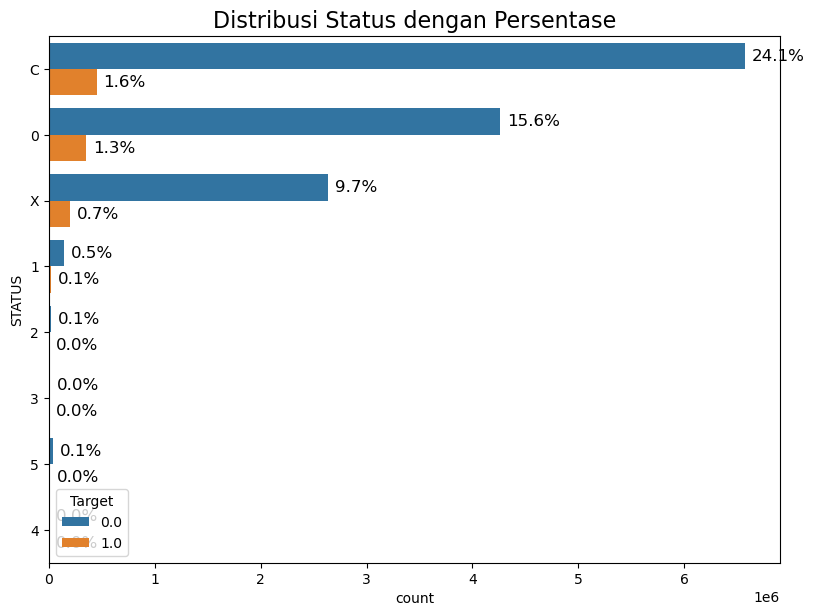

In [24]:
plt.figure(figsize=(8, 6))
sns.countplot(data=biro_b, y='STATUS', hue='TARGET')  
plt.xticks(rotation=0)
plt.tight_layout()
ax = plt.gca()
total = len(biro_b['STATUS'])
for p in ax.patches:
    percentage = f"{100 * p.get_width() / total:.1f}%"
    ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                ha='left', va='center', fontsize=12, color='black', xytext=(5, 0),
                textcoords='offset points')

plt.title(f"Distribusi Status dengan Persentase", fontsize=16)
plt.legend(title="Target", loc="best")
plt.show()


STATUS = C (y=1.6%)

Proporsi status yang yes ditarget paling banyak di status c dengan nilai 1.6%

## Posh Cash Balance Data Exploration

In [157]:
pc = pd.read_csv('POS_CASH_balance.csv')

In [158]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
pc = pd.merge(pc, biro[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')

In [159]:
pc = pc.sample(n=310000,random_state = 123)

In [66]:
pc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310000 entries, 47556790 to 998417
Data columns (total 9 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   SK_ID_PREV             310000 non-null  int64  
 1   SK_ID_CURR             310000 non-null  int64  
 2   MONTHS_BALANCE         310000 non-null  int64  
 3   CNT_INSTALMENT         309254 non-null  float64
 4   CNT_INSTALMENT_FUTURE  309245 non-null  float64
 5   NAME_CONTRACT_STATUS   310000 non-null  object 
 6   SK_DPD                 310000 non-null  int64  
 7   SK_DPD_DEF             310000 non-null  int64  
 8   TARGET                 256047 non-null  float64
dtypes: float64(3), int64(5), object(1)
memory usage: 23.7+ MB


In [18]:
pc.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF,TARGET
count,3.100000e+05,310000.000000,310000.000000,309254.000000,309245.000000,310000.00000,310000.000000,256047.000000
mean,1.901860e+06,277881.126358,-36.738210,17.296898,10.695274,11.19321,0.603035,0.074158
std,5.360937e+05,102651.968270,26.255822,12.371507,11.466293,132.05379,31.901218,0.262029
min,1.000002e+06,100003.000000,-96.000000,1.000000,0.000000,0.00000,0.000000,0.000000
25%,1.431077e+06,188985.250000,-57.000000,10.000000,3.000000,0.00000,0.000000,0.000000
50%,1.895440e+06,277769.000000,-30.000000,12.000000,7.000000,0.00000,0.000000,0.000000
75%,2.366641e+06,366572.000000,-15.000000,24.000000,14.000000,0.00000,0.000000,0.000000
max,2.843497e+06,456255.000000,-1.000000,72.000000,72.000000,3928.00000,3383.000000,1.000000


- Data Posh cash Balance berisi 310.000 baris dengan 4 kolom numerik dan 1kolom object
- Terdapat missing value pada 3 kolom `CNT_INSTALMENT` dan `CNT_INSTALMENT_FUTURE` dengan proporsi dibawah 24% dan kolom target dengan proporsi 17%
- **Terdapat outlier di 4 kolom** yakni `CNT_INSTALMENT`, `CNT_INSTALMENT_FUTURE`,`SK_DPD`, `SK_DPD_DEF`
 - **Berdistribusi positively skewed**  pada kolom `CNT_INSTALMENT`, `CNT_INSTALMENT_FUTURE`,SK_DPD`, `SK_DPD_DEF

In [58]:
pc.isna().sum() / pc.shape[0] * 100

SK_ID_PREV                0.000000
SK_ID_CURR                0.000000
MONTHS_BALANCE            0.000000
CNT_INSTALMENT            0.240645
CNT_INSTALMENT_FUTURE     0.243548
NAME_CONTRACT_STATUS      0.000000
SK_DPD                    0.000000
SK_DPD_DEF                0.000000
TARGET                   17.404194
dtype: float64

In [60]:
pc.isna().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT             746
CNT_INSTALMENT_FUTURE      755
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
TARGET                   53953
dtype: int64

In [51]:
num_pc = [ 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'SK_DPD',
       'SK_DPD_DEF']

Text(0.5, 1.02, 'Distribusi Data Posh Cash Balance dengan Violinplot')

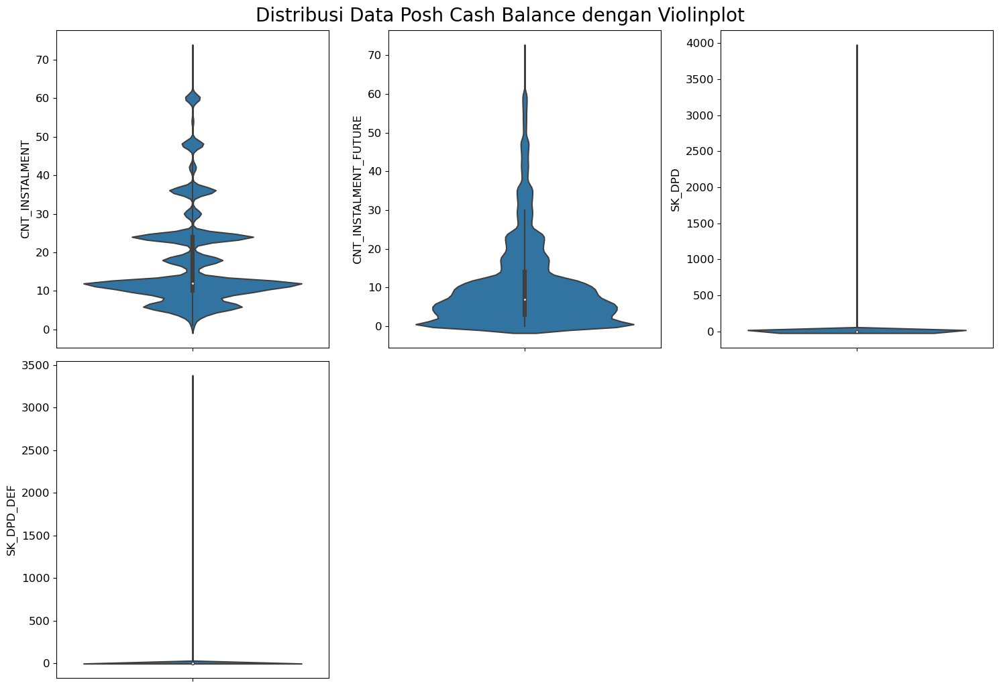

In [27]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(num_pc)):
    sns.violinplot(y = pc[num_pc[i]], ax = fig.add_subplot(math.ceil(len(num_pc)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_pc[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Posh Cash Balance dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Posh Cash Balance dengan Boxplot')

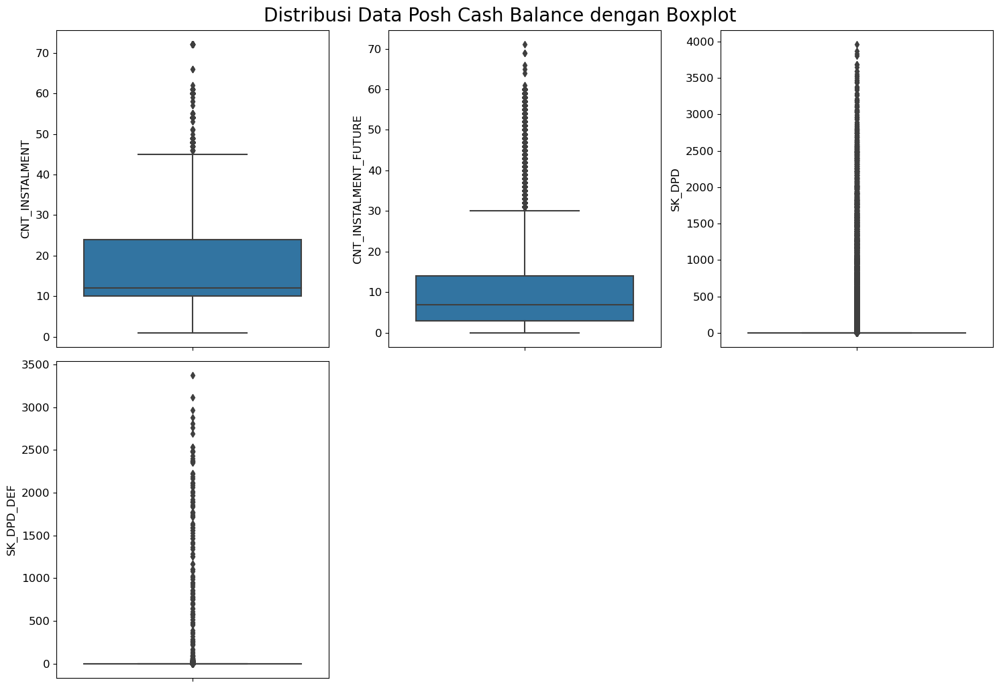

In [28]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(num_pc)):
    sns.boxplot(y = pc[num_pc[i]], ax = fig.add_subplot(math.ceil(len(num_pc)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_pc[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Posh Cash Balance dengan Boxplot", fontsize=20, y=1.02)

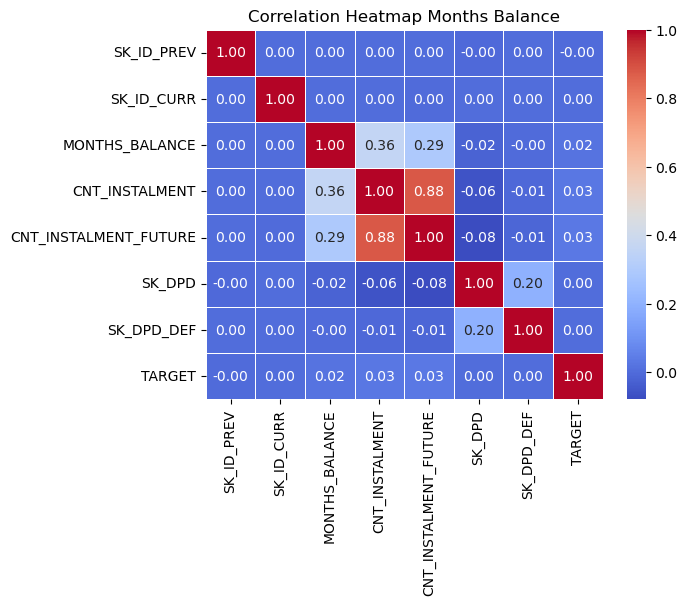

In [100]:
pc_corr = pc.corr()
sns.heatmap(pc_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Months Balance')
plt.show()

Pada Data Cash Balance Kolom yang paling tinggi berkorelasi dengan kolom target yakni CNT_INSTALLMENT dengan nilai 0.03

## Installments Data Exploration

In [160]:
ins = pd.read_csv('installments_payments.csv')

In [161]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
ins = pd.merge(ins, biro[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')

In [162]:
ins = ins.sample(n=310000, random_state=123)

In [65]:
ins.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310000 entries, 29111516 to 68301753
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   SK_ID_PREV              310000 non-null  int64  
 1   SK_ID_CURR              310000 non-null  int64  
 2   NUM_INSTALMENT_VERSION  310000 non-null  float64
 3   NUM_INSTALMENT_NUMBER   310000 non-null  int64  
 4   DAYS_INSTALMENT         310000 non-null  float64
 5   DAYS_ENTRY_PAYMENT      309939 non-null  float64
 6   AMT_INSTALMENT          310000 non-null  float64
 7   AMT_PAYMENT             309939 non-null  float64
 8   TARGET                  255481 non-null  float64
dtypes: float64(6), int64(3)
memory usage: 23.7 MB


In [136]:
ins.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT', 'TARGET'],
      dtype='object')

In [61]:
ins.isna().sum() / ins.shape[0] * 100

SK_ID_PREV                 0.000000
SK_ID_CURR                 0.000000
NUM_INSTALMENT_VERSION     0.000000
NUM_INSTALMENT_NUMBER      0.000000
DAYS_INSTALMENT            0.000000
DAYS_ENTRY_PAYMENT         0.019677
AMT_INSTALMENT             0.000000
AMT_PAYMENT                0.019677
TARGET                    17.586774
dtype: float64

In [56]:
num_ins = ['NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT']

In [57]:
ins[num_ins].describe()

,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.727707e+06,1.727707e+06,1.727707e+06,1.727351e+06,1.727707e+06,1.727351e+06
mean,8.386081e-01,1.965452e+01,-1.098114e+03,-1.106788e+03,1.733645e+04,1.763017e+04
std,1.012113e+00,2.722925e+01,8.064934e+02,8.063632e+02,5.435045e+04,5.839305e+04
min,0.000000e+00,1.000000e+00,-2.922000e+03,-3.004000e+03,0.000000e+00,0.000000e+00
25%,0.000000e+00,4.000000e+00,-1.742000e+03,-1.751000e+03,3.896100e+03,3.333420e+03
50%,1.000000e+00,8.000000e+00,-9.020000e+02,-9.110000e+02,8.420805e+03,7.867080e+03
75%,1.000000e+00,2.100000e+01,-4.030000e+02,-4.120000e+02,1.643400e+04,1.587100e+04
max,6.100000e+01,2.580000e+02,-2.000000e+00,-2.000000e+00,2.390324e+06,2.390324e+06


- Data Installments berisi 310.000 baris dengan 9 kolom numerik 
- Terdapat missing value pada 3 kolom `DAYS_ENTRY_PAYMENT` dan `AMT_PAYMENT` dengan proporsi dibawah 1% dan kolom target dengan proporsi 17%
- **Terdapat outlier di 4 kolom** yakni `NUM_INSTALMENT_VERSION`, `NUM_INSTALMENT_NUMBER`,`AMT_INSTALMENT`, `AMT_PAYMENT`
 - **Berdistribusi positively skewed**  pada kolom  `NUM_INSTALMENT_NUMBER`,`AMT_INSTALMENT`, `AMT_PAYMENT`
 - **Berdistribusi negatively skewed** `DAYS_INSTALMENT`, `DAYS_ENTRY_PAYMENT`
 - Terdapat kolom kategorik yakni kolom `NUM_INSTALMENT_VERSION`

Text(0.5, 1.02, 'Distribusi Data Installments dengan Violinplot')

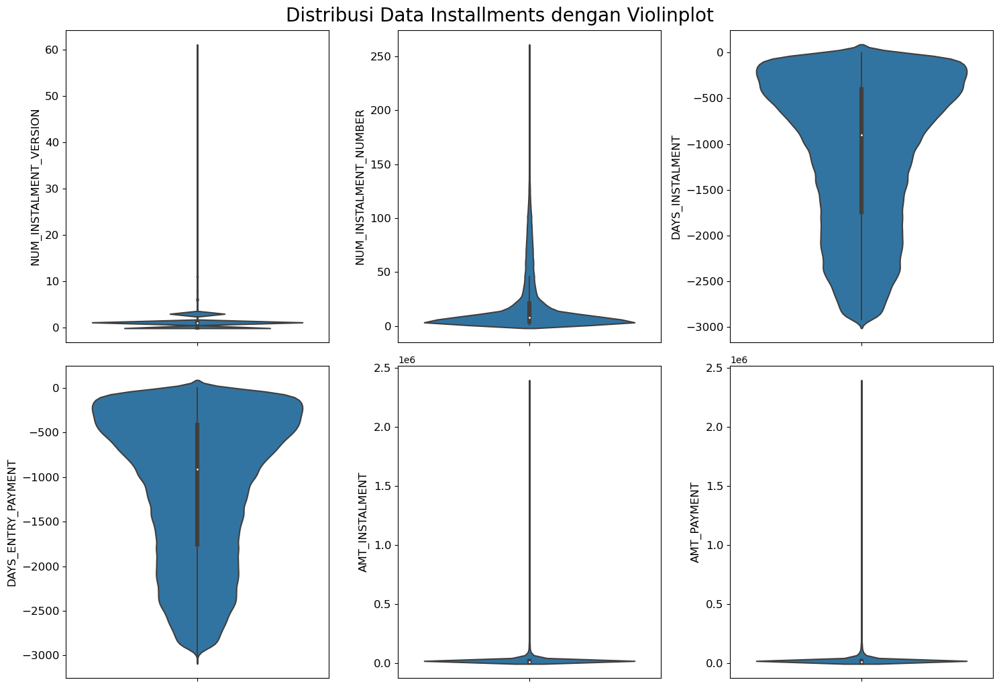

In [60]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(num_ins)):
    sns.violinplot(y = ins[num_ins[i]], ax = fig.add_subplot(math.ceil(len(num_ins)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_ins[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Installments dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Installments dengan Boxplot')

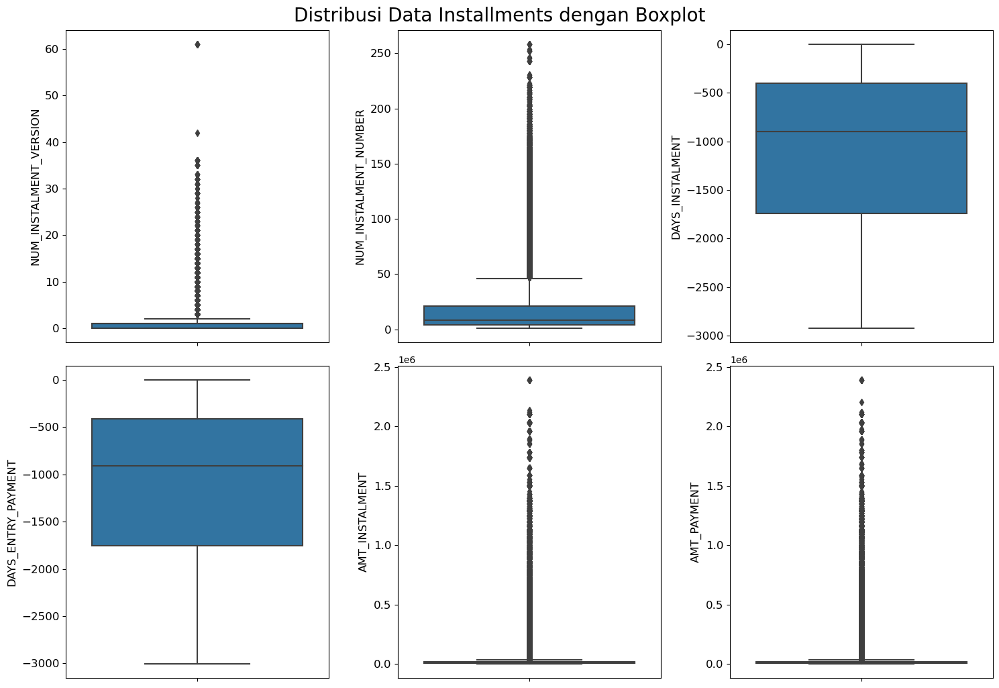

In [61]:
fig = plt.figure(figsize=(15, 10))
for i in range(len(num_ins)):
    sns.boxplot(y = ins[num_ins[i]], ax = fig.add_subplot(math.ceil(len(num_ins)/3),3, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_ins[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Installments dengan Boxplot", fontsize=20, y=1.02)

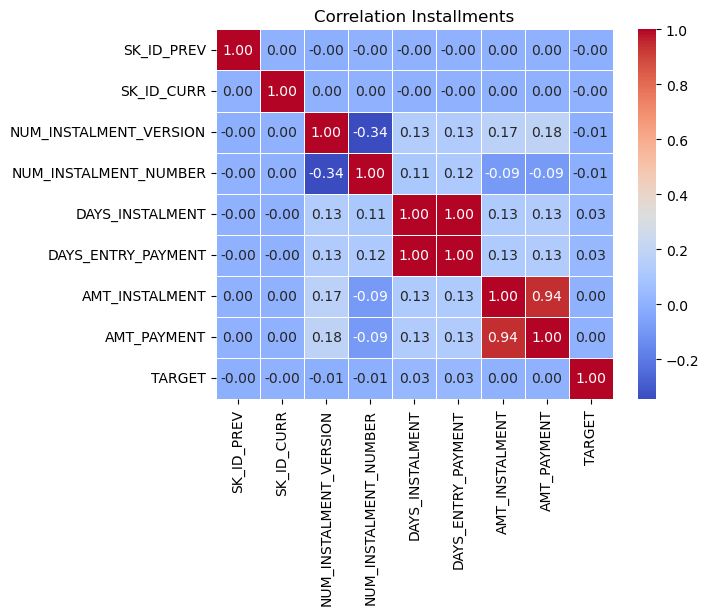

In [103]:
ins_corr = ins.corr()
sns.heatmap(ins_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Installments')
plt.show()

Kolom yang berkorelasi paling tinggi dengan target ialah kolom `DAYS_INSTALLMENT` dengan korelasi 0.03

## Credit Data Exploration

In [163]:
credit = pd.read_csv('credit_card_balance.csv')

In [164]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
credit = pd.merge(credit, biro[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')

In [165]:
credit = credit.sample(n=310000,random_state = 123)

In [64]:
credit.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310000 entries, 19554033 to 373849
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   SK_ID_PREV                  310000 non-null  int64  
 1   SK_ID_CURR                  310000 non-null  int64  
 2   MONTHS_BALANCE              310000 non-null  int64  
 3   AMT_BALANCE                 310000 non-null  float64
 4   AMT_CREDIT_LIMIT_ACTUAL     310000 non-null  int64  
 5   AMT_DRAWINGS_ATM_CURRENT    253161 non-null  float64
 6   AMT_DRAWINGS_CURRENT        310000 non-null  float64
 7   AMT_DRAWINGS_OTHER_CURRENT  253161 non-null  float64
 8   AMT_DRAWINGS_POS_CURRENT    253161 non-null  float64
 9   AMT_INST_MIN_REGULARITY     284853 non-null  float64
 10  AMT_PAYMENT_CURRENT         252070 non-null  float64
 11  AMT_PAYMENT_TOTAL_CURRENT   310000 non-null  float64
 12  AMT_RECEIVABLE_PRINCIPAL    310000 non-null  float64
 13  AMT_REC

In [28]:
credit.describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF,TARGET
count,3.100000e+05,310000.000000,310000.000000,310000.000000,3.100000e+05,253161.000000,3.100000e+05,253161.000000,2.531610e+05,284853.000000,...,310000.000000,310000.000000,253161.000000,310000.000000,253161.000000,253161.000000,284853.000000,310000.000000,310000.000000,253659.000000
mean,1.902880e+06,277798.998229,-35.627426,55910.945960,1.477065e+05,5657.895621,7.029074e+03,305.497396,2.632937e+03,3401.115875,...,55716.977008,55724.816359,0.294718,0.634197,0.004823,0.477044,20.966607,8.582113,0.227374,0.078676
std,5.364927e+05,102692.744864,26.684586,104724.861108,1.619010e+05,27630.092643,3.330286e+04,8670.763920,2.007396e+04,5539.458637,...,104404.584609,104408.766612,1.068631,2.961253,0.085925,2.957994,19.608185,91.553114,16.158180,0.269234
min,1.000030e+06,100011.000000,-96.000000,-135359.010000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,...,-133442.235000,-133442.235000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.431549e+06,188820.000000,-57.000000,0.000000,4.500000e+04,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000
50%,1.895394e+06,277004.000000,-29.000000,0.000000,1.125000e+05,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,0.000000,0.000000,0.000000
75%,2.368495e+06,366955.000000,-12.000000,84475.248750,1.800000e+05,0.000000,0.000000e+00,0.000000,0.000000e+00,5625.000000,...,84341.058750,84380.163750,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
max,2.843493e+06,456250.000000,-1.000000,964664.505000,1.350000e+06,900000.000000,1.317042e+06,898546.500000,1.317042e+06,56250.000000,...,952555.005000,952555.005000,41.000000,135.000000,8.000000,135.000000,115.000000,2770.000000,2650.000000,1.000000


In [62]:
credit.isna().sum() / credit.shape[0] * 100

SK_ID_PREV                     0.000000
SK_ID_CURR                     0.000000
MONTHS_BALANCE                 0.000000
AMT_BALANCE                    0.000000
AMT_CREDIT_LIMIT_ACTUAL        0.000000
AMT_DRAWINGS_ATM_CURRENT      18.335161
AMT_DRAWINGS_CURRENT           0.000000
AMT_DRAWINGS_OTHER_CURRENT    18.335161
AMT_DRAWINGS_POS_CURRENT      18.335161
AMT_INST_MIN_REGULARITY        8.111935
AMT_PAYMENT_CURRENT           18.687097
AMT_PAYMENT_TOTAL_CURRENT      0.000000
AMT_RECEIVABLE_PRINCIPAL       0.000000
AMT_RECIVABLE                  0.000000
AMT_TOTAL_RECEIVABLE           0.000000
CNT_DRAWINGS_ATM_CURRENT      18.335161
CNT_DRAWINGS_CURRENT           0.000000
CNT_DRAWINGS_OTHER_CURRENT    18.335161
CNT_DRAWINGS_POS_CURRENT      18.335161
CNT_INSTALMENT_MATURE_CUM      8.111935
NAME_CONTRACT_STATUS           0.000000
SK_DPD                         0.000000
SK_DPD_DEF                     0.000000
TARGET                        18.174516
dtype: float64

In [30]:
credit.isna().sum()

SK_ID_PREV                        0
SK_ID_CURR                        0
MONTHS_BALANCE                    0
AMT_BALANCE                       0
AMT_CREDIT_LIMIT_ACTUAL           0
AMT_DRAWINGS_ATM_CURRENT      56839
AMT_DRAWINGS_CURRENT              0
AMT_DRAWINGS_OTHER_CURRENT    56839
AMT_DRAWINGS_POS_CURRENT      56839
AMT_INST_MIN_REGULARITY       25147
AMT_PAYMENT_CURRENT           57930
AMT_PAYMENT_TOTAL_CURRENT         0
AMT_RECEIVABLE_PRINCIPAL          0
AMT_RECIVABLE                     0
AMT_TOTAL_RECEIVABLE              0
CNT_DRAWINGS_ATM_CURRENT      56839
CNT_DRAWINGS_CURRENT              0
CNT_DRAWINGS_OTHER_CURRENT    56839
CNT_DRAWINGS_POS_CURRENT      56839
CNT_INSTALMENT_MATURE_CUM     25147
NAME_CONTRACT_STATUS              0
SK_DPD                            0
SK_DPD_DEF                        0
TARGET                        56341
dtype: int64

In [41]:
credit.size

7440000

- Data Credit  berisi 310.000 baris dengan 23 kolom numerik  dan 1 kolom object
- Terdapat missing value pada  kolom `AMT_DRAWINGS_ATM_CURRENT`,`AMT_DRAWINGS_OTHER_CURRENT`, `AMT_DRAWINGS_POS_CURRENT`, `AMT_INST_MIN_REGULARITY`, `AMT_PAYMENT_CURRENT`, `CNT_DRAWINGS_ATM_CURRENT`, `CNT_DRAWINGS_POS_CURRENT`, `CNT_INSTALMENT_MATURE_CUM` dan `TARGET` dengan proporsi dibawah 18% 
- **Terdapat outlier** di semua kolom numerik
 - **Berdistribusi positively skewed**  pada semua kolom numerik

In [127]:
num_credit = ['AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM']

Text(0.5, 1.02, 'Distribusi Data Credit Card dengan Violinplot')

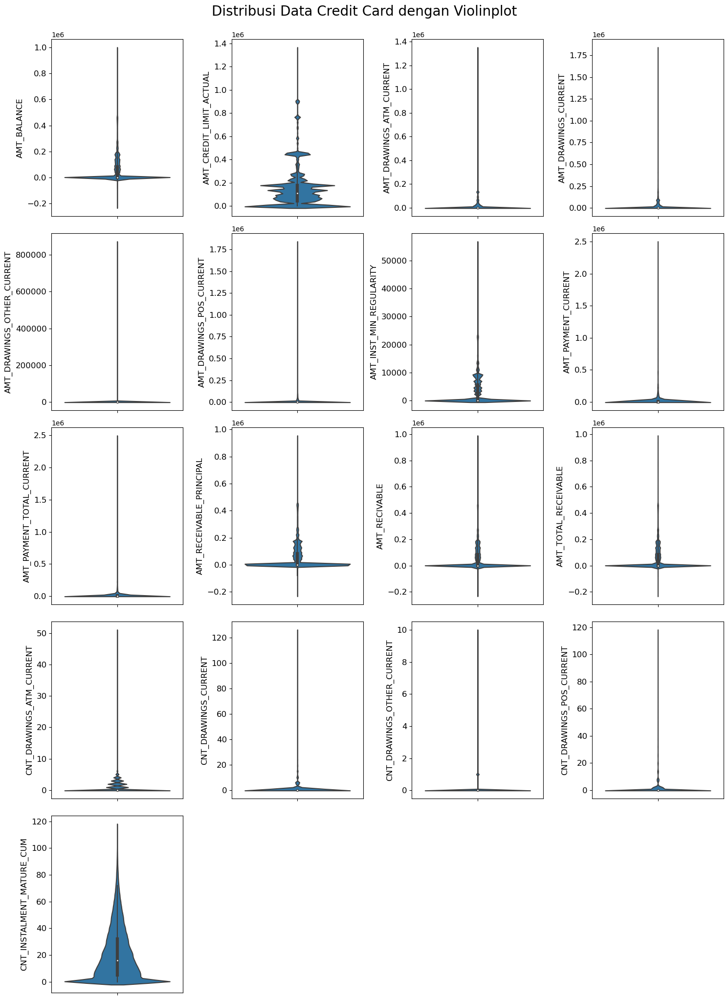

In [67]:
fig = plt.figure(figsize=(15, 20))
for i in range(len(num_credit)):
    sns.violinplot(y = credit[num_credit[i]], ax = fig.add_subplot(math.ceil(len(num_credit)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_credit[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Credit Card dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Credit Card dengan Boxplot')

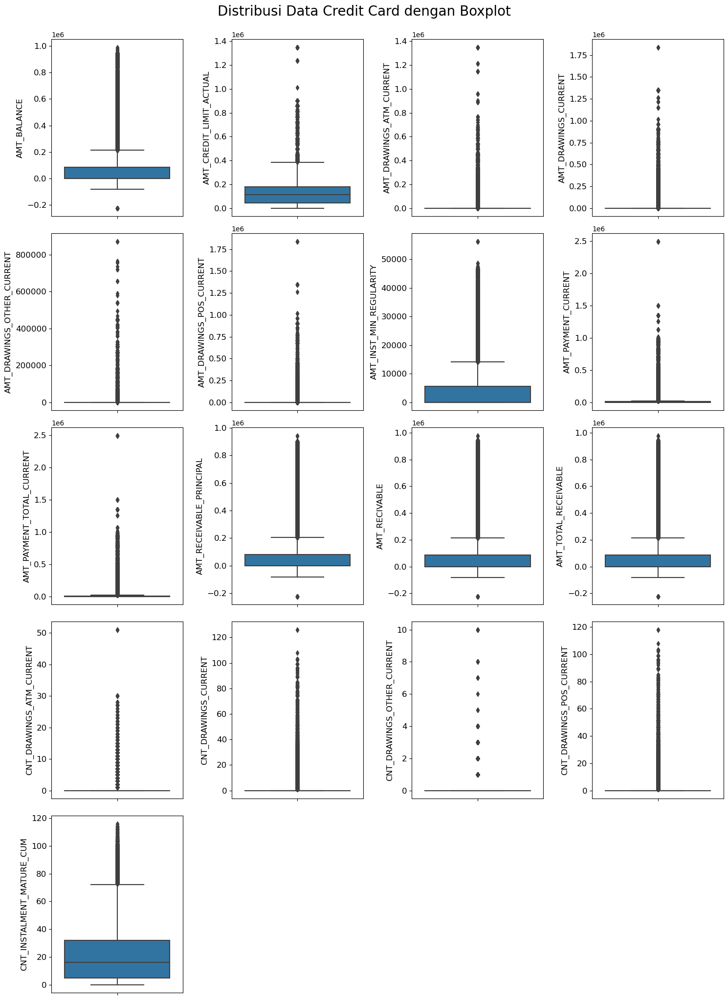

In [68]:
fig = plt.figure(figsize=(15, 20))
for i in range(len(num_credit)):
    sns.boxplot(y = credit[num_credit[i]], ax = fig.add_subplot(math.ceil(len(num_credit)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_credit[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Credit Card dengan Boxplot", fontsize=20, y=1.02)

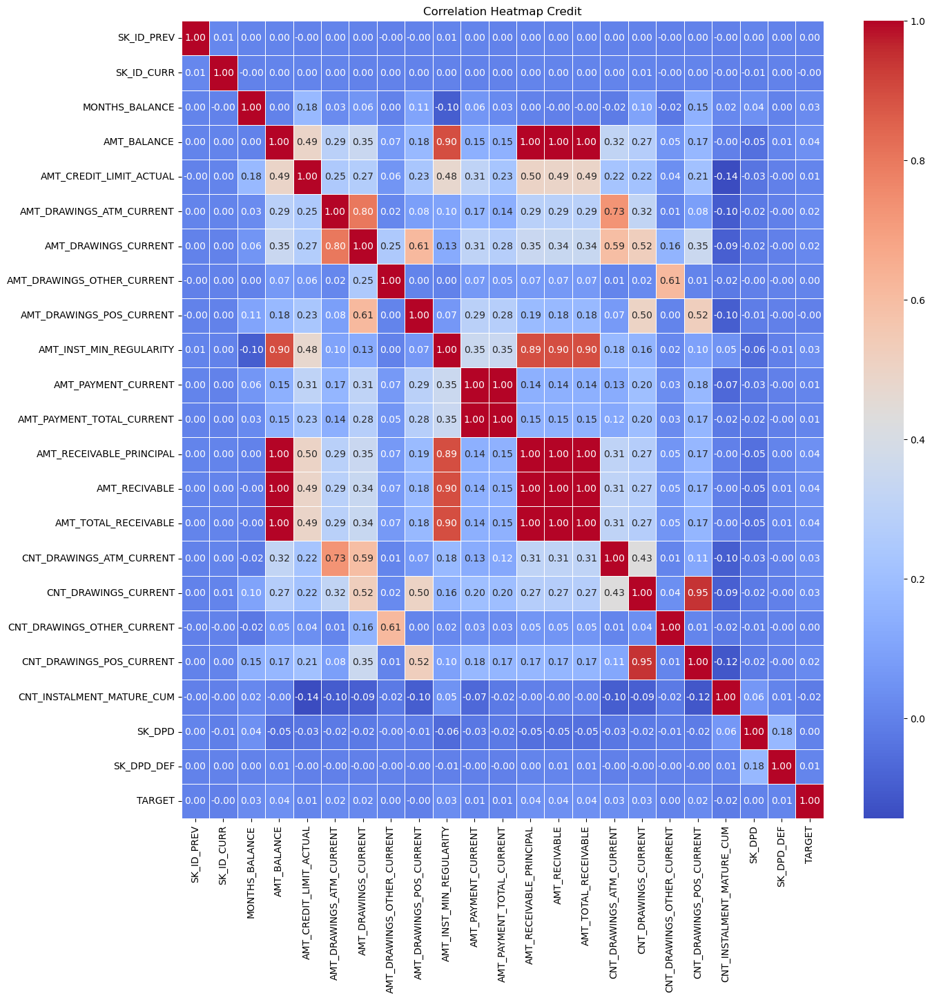

In [42]:
plt.figure(figsize=(15,15))
credit_corr = credit.corr()
sns.heatmap(credit_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Credit')
plt.show()

kolom yang berkorelasi tinggi dengan target yakni kolom dengan nilai 0.04, namun ada 4 kolom dengan nilai 0.04, maka kami akan memilih salah satu nya sehingga kami memilih `AMT_RECEIVABLE`

In [106]:
credit.isna().sum()

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      336870
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    336870
AMT_DRAWINGS_POS_CURRENT      336870
AMT_INST_MIN_REGULARITY       149191
AMT_PAYMENT_CURRENT           343128
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      336870
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    336870
CNT_DRAWINGS_POS_CURRENT      336870
CNT_INSTALMENT_MATURE_CUM     149191
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
TARGET                        338319
dtype: int64

## Previous Data Exploration

In [166]:
prev = pd.read_csv('previous_application.csv')

In [167]:
# Merge DataFrame berdasarkan kolom SK_ID_CURR
prev = pd.merge(prev, biro[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')

In [168]:
prev = prev.sample (n= 310000, random_state=123)

In [63]:
prev.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310000 entries, 3489717 to 2399280
Data columns (total 38 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_PREV                   310000 non-null  int64  
 1   SK_ID_CURR                   310000 non-null  int64  
 2   NAME_CONTRACT_TYPE           310000 non-null  object 
 3   AMT_ANNUITY                  239957 non-null  float64
 4   AMT_APPLICATION              310000 non-null  float64
 5   AMT_CREDIT                   310000 non-null  float64
 6   AMT_DOWN_PAYMENT             141959 non-null  float64
 7   AMT_GOODS_PRICE              238571 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   310000 non-null  object 
 9   HOUR_APPR_PROCESS_START      310000 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  310000 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       310000 non-null  int64  
 12  RATE_DOWN_PAYMENT            141959 non-null  float

In [68]:
prev.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,TARGET
count,3.100000e+05,310000.000000,239957.000000,3.100000e+05,3.100000e+05,1.419590e+05,2.385710e+05,310000.000000,310000.000000,141959.000000,...,310000.000000,3.100000e+05,239958.000000,177060.000000,177060.000000,177060.000000,177060.000000,177060.000000,177060.000000,254174.000000
mean,1.924818e+06,278336.896248,16216.639857,1.865872e+05,2.092934e+05,6.366139e+03,2.424872e+05,12.473681,0.996232,0.078844,...,-913.816465,3.157408e+02,16.947166,342278.223467,12457.194736,32738.310465,68019.762465,73927.716492,0.334762,0.089222
std,5.314391e+05,102886.379287,15080.215115,3.145032e+05,3.425938e+05,2.033845e+04,3.391167e+05,3.346556,0.061266,0.107266,...,792.743007,7.380179e+03,15.393088,88806.954297,69329.656824,105487.414407,143276.169054,147767.236241,0.471909,0.285065
min,1.000022e+06,100002.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,...,-2922.000000,-1.000000e+00,0.000000,-2921.000000,-2892.000000,-2801.000000,-2876.000000,-2847.000000,0.000000,0.000000
25%,1.466132e+06,189194.750000,6234.840000,1.821150e+04,2.376000e+04,0.000000e+00,4.945500e+04,10.000000,1.000000,0.000000,...,-1384.000000,-1.000000e+00,6.000000,365243.000000,-1739.000000,-1358.000000,-1431.000000,-1381.000000,0.000000,0.000000
50%,1.926263e+06,278262.500000,11250.000000,6.969600e+04,7.987050e+04,1.530000e+03,1.125000e+05,12.000000,1.000000,0.049664,...,-617.000000,0.000000e+00,12.000000,365243.000000,-907.000000,-421.000000,-628.000000,-583.000000,0.000000,0.000000
75%,2.383847e+06,367881.750000,21315.825000,1.980000e+05,2.250000e+05,7.276500e+03,2.618867e+05,15.000000,1.000000,0.108909,...,-287.000000,7.600000e+01,24.000000,365243.000000,-459.000000,121.000000,-132.000000,-92.000000,1.000000,0.000000
max,2.845381e+06,456255.000000,417927.645000,5.085000e+06,4.104351e+06,2.135700e+06,5.085000e+06,23.000000,1.000000,0.972550,...,-2.000000,4.000000e+06,72.000000,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000,1.000000


In [67]:
prev.isna().sum() / prev.shape[0] * 100

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.594516
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000000
AMT_DOWN_PAYMENT               54.206774
AMT_GOODS_PRICE                23.041613
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              54.206774
RATE_INTEREST_PRIMARY          99.653226
RATE_INTEREST_PRIVILEGED       99.653226
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                48.688710
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [73]:
num_prev =[ 'NFLAG_LAST_APPL_IN_DAY', 'DAYS_DECISION', 'SELLERPLACE_AREA', 
          'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 
           'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']
cat_prev =['WEEKDAY_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
           'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE, CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
           'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE, NAME_SELLER_INDUSTRY',
           'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']

- Data Previous berisi 310.000  baris dengan 23 kolom numerik  dan 1 kolom object
- Terdapat missing value pada  kolom `AMT_ANNUITY`,`AMT_ANNUITY `, `AMT_DOWN_PAYMENT`, `AMT_GOODS_PRICE`, `RATE_DOWN_PAYMENT`, `RATE_INTEREST_PRIMARY `, `RATE_INTEREST_PRIMARY`, `RATE_INTEREST_PRIVILEGED`, `NAME_TYPE_SUITE`, `CNT_PAYMENT`, `PRODUCT_COMBINATION`, `DAYS_FIRST_DRAWING`, `DAYS_FIRST_DUE`, `DAYS_LAST_DUE_1ST_VERSION`, `DAYS_LAST_DUE`, `DAYS_TERMINATION`,`NFLAG_INSURED_ON_APPROVA` dan `TARGET` dengan proporsi dibawah 18% 
- **Terdapat outlier di semua kolom** numerik kecuali pada kolom `DAYS_DECISION`
- **Berdistribusi negatif** pada kolom `NFLAG_LAST_APPL_IN_DAY`,`RATE_INTEREST_PREVILEGED`, `DAYS_FIRST_DRAWING`
 - **Berdistribusi positively skewed**  pada kolom , ``SELLERPLACE_AREA``, ``RATE_DOWN_PAYMENT``, ``RATE_INTEREST_PRIMARY``, ``DAYS_FIRST_DRAWING``, ``DAYS_FIRST_DUE``, ``DAYS_LAST_DUE_1ST_VERSION``, ``DAYS_LAST_DUE``, ``DAYS_TERMINATION``
- Variabel biner dan variabel waktu yakni ``HOUR_APPR_PROCESS_START`` dan ``DAYS_DECISION``

Text(0.5, 1.02, 'Distribusi Data Previous dengan Violinplot')

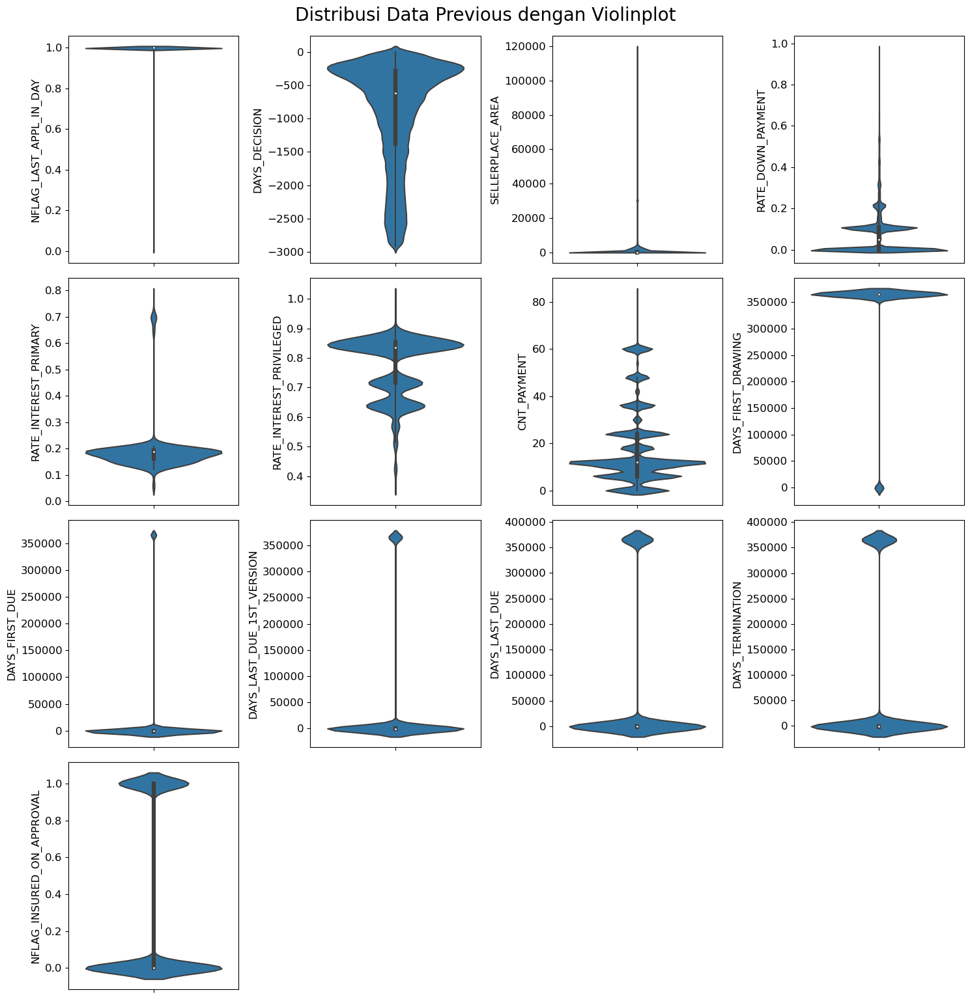

In [74]:
fig = plt.figure(figsize=(15, 15))
for i in range(len(num_prev)):
    sns.violinplot(y = prev[num_prev[i]], ax = fig.add_subplot(math.ceil(len(num_prev)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_prev[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Previous dengan Violinplot", fontsize=20, y=1.02)

Text(0.5, 1.02, 'Distribusi Data Previous dengan Boxplot')

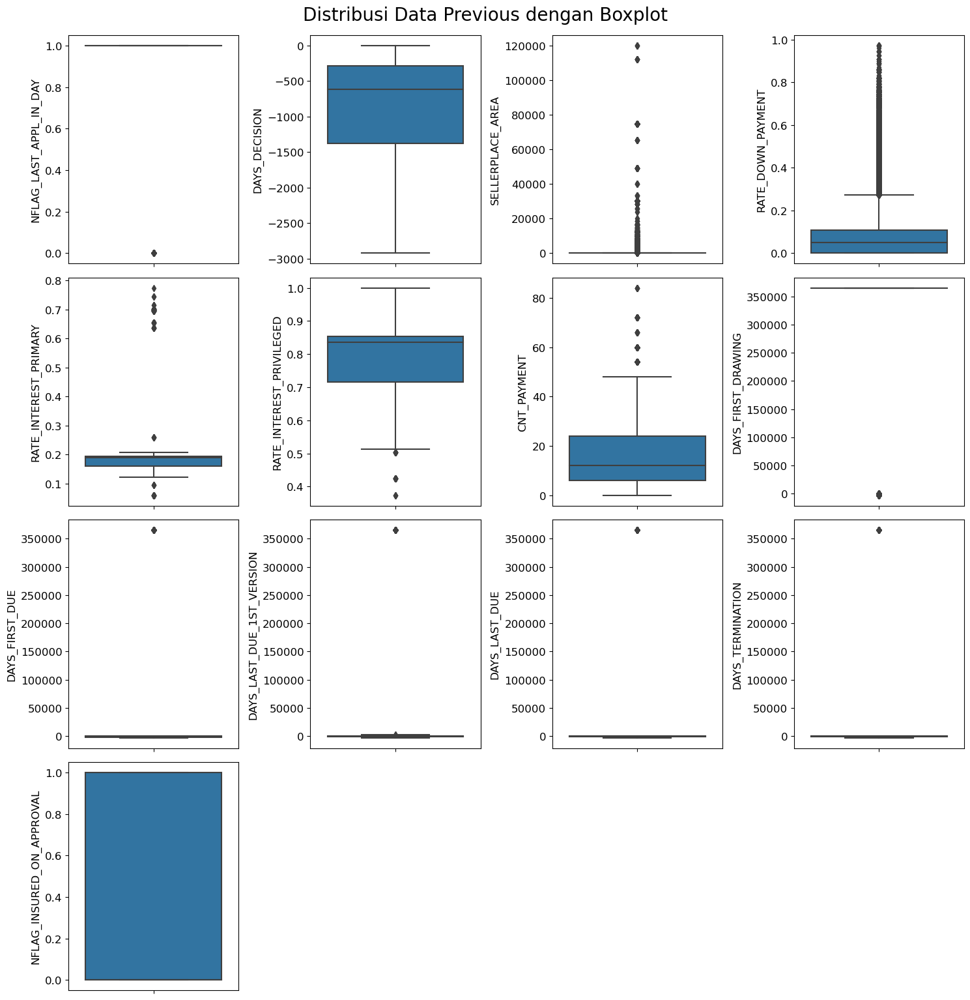

In [75]:
fig = plt.figure(figsize=(15, 15))
for i in range(len(num_prev)):
    sns.boxplot(y = prev[num_prev[i]], ax = fig.add_subplot(math.ceil(len(num_prev)/4),4, i+1))
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.ylabel(ylabel = num_prev[i], fontsize=12)
    plt.tight_layout()
plt.suptitle("Distribusi Data Previous dengan Boxplot", fontsize=20, y=1.02)

In [87]:
prev.select_dtypes(include='object').columns

Index(['NAME_CONTRACT_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE',
       'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

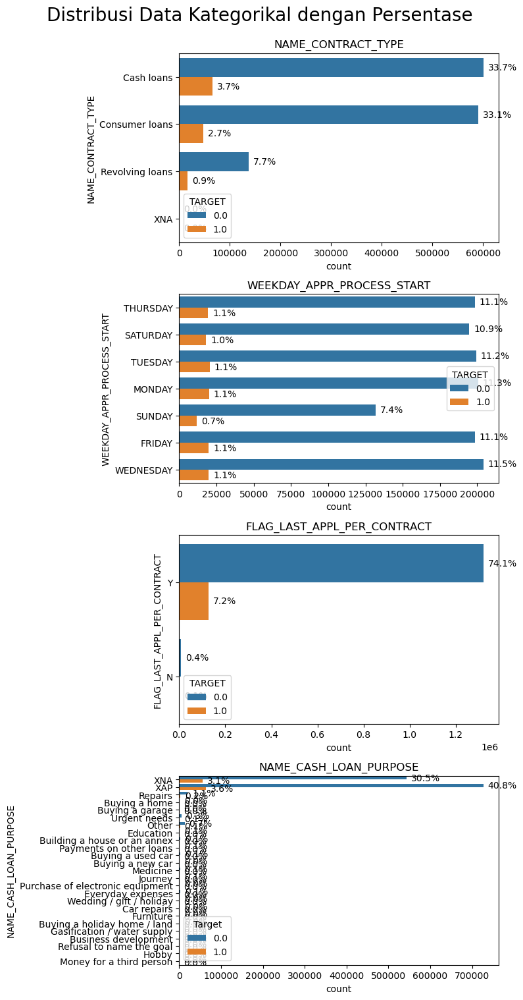

In [80]:
cat1 = ['NAME_CONTRACT_TYPE','WEEKDAY_APPR_PROCESS_START','FLAG_LAST_APPL_PER_CONTRACT',
'NAME_CASH_LOAN_PURPOSE']

plt.figure(figsize=(8, 18))
for i, column in enumerate(cat1):  
    plt.subplot(5, 1, 1+i)
    sns.countplot(data=prev, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(prev[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()


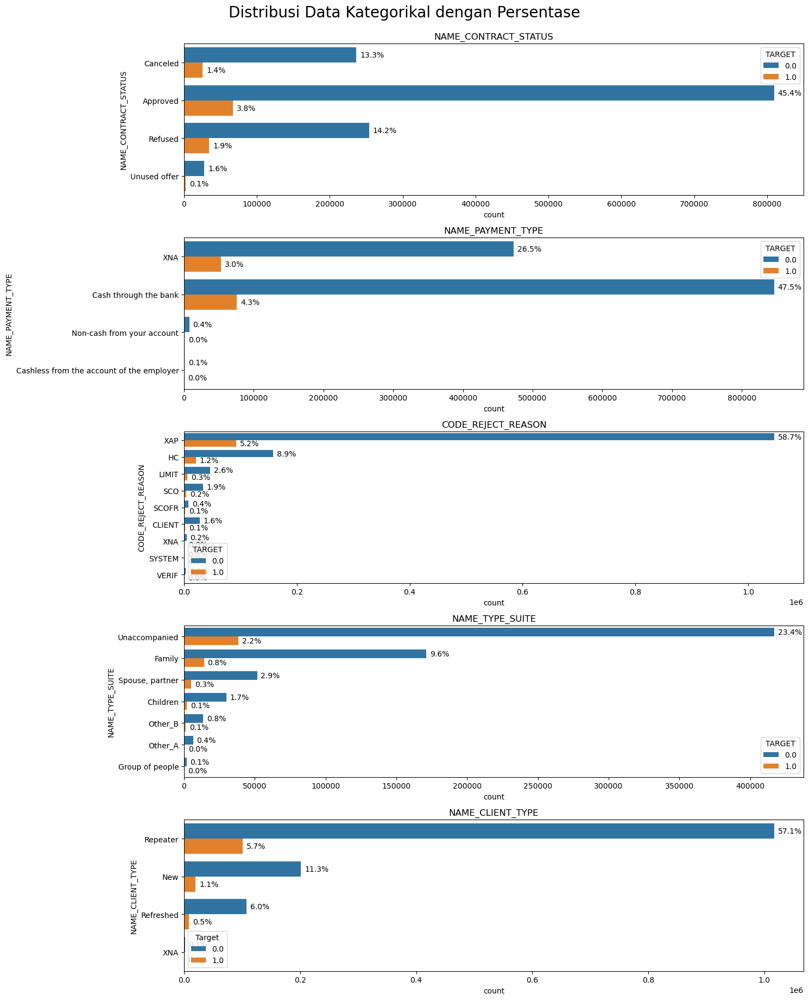

In [89]:
cat2 = ['NAME_CONTRACT_STATUS', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON',
       'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE']

plt.figure(figsize=(15, 18))
for i, column in enumerate(cat2):  
    plt.subplot(5, 1, 1+i)
    sns.countplot(data=prev, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(prev[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()


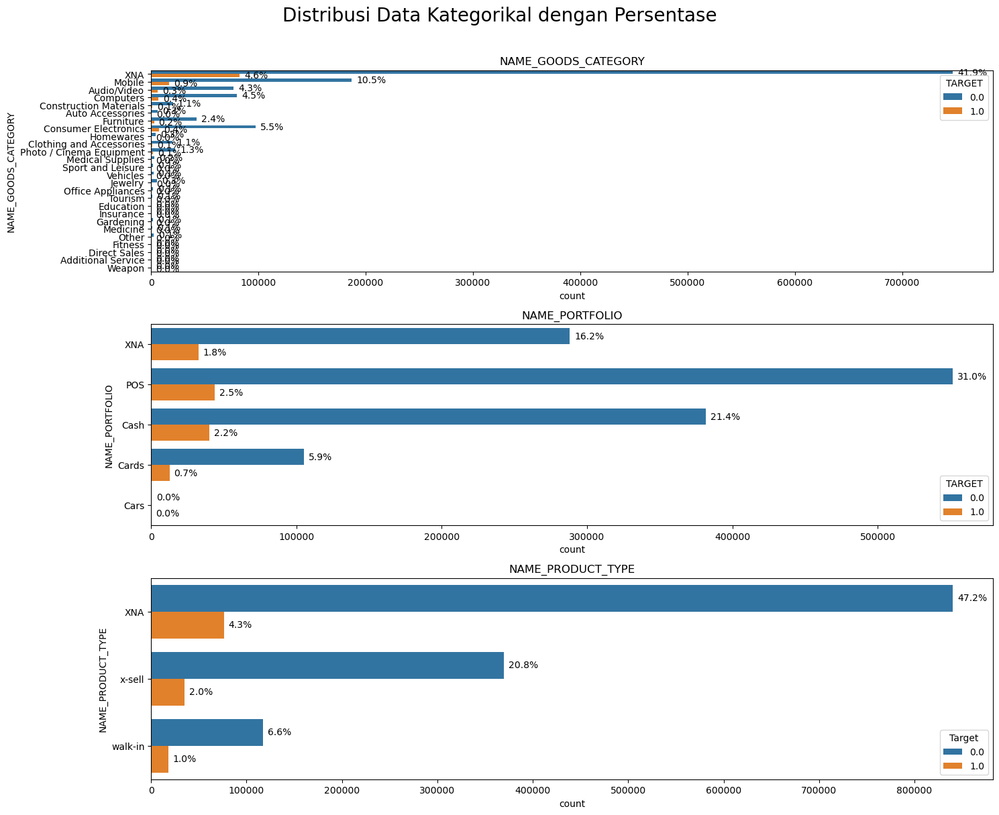

In [ ]:
cat3 = ['NAME_GOODS_CATEGORY',
       'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE']

plt.figure(figsize=(15, 30))
for i, column in enumerate(cat3):  
    plt.subplot(8, 1, 1+i)
    sns.countplot(data=prev, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(prev[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()


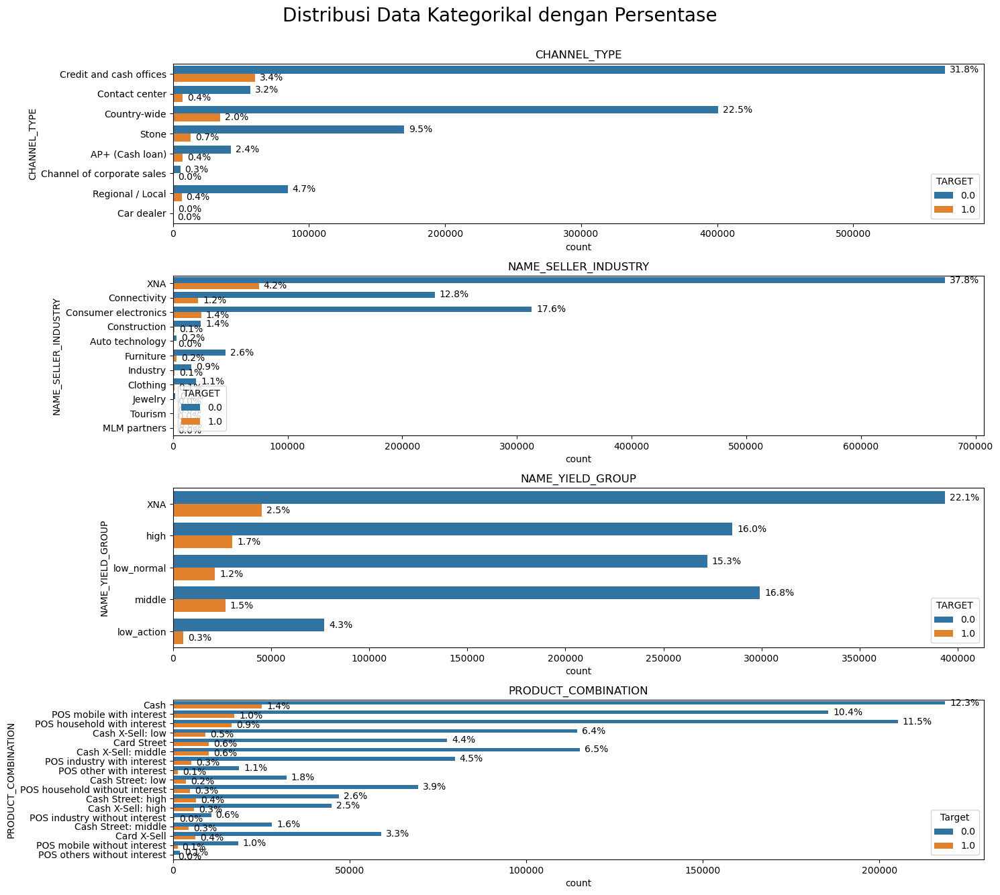

In [97]:
cat4 = ['CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION']

plt.figure(figsize=(15, 25))
for i, column in enumerate(cat4):  
    plt.subplot(8, 1, 1+i)
    sns.countplot(data=prev, y=column, hue='TARGET')  
    plt.xticks(rotation=0)
    plt.tight_layout()
    ax = plt.gca()
    total = len(prev[column])
    for p in ax.patches:
        percentage = f"{100 * p.get_width() / total:.1f}%"
        ax.annotate(f"{percentage}", (p.get_width(), p.get_y() + p.get_height() / 2.),
                    ha='left', va='center', fontsize=10, color='black', xytext=(5, 0),
                    textcoords='offset points')
    plt.title(f"{column}", fontsize=12)
plt.suptitle("Distribusi Data Kategorikal dengan Persentase", fontsize=20, y=1.02)
plt.legend(title="Target", loc="best")
plt.show()

    

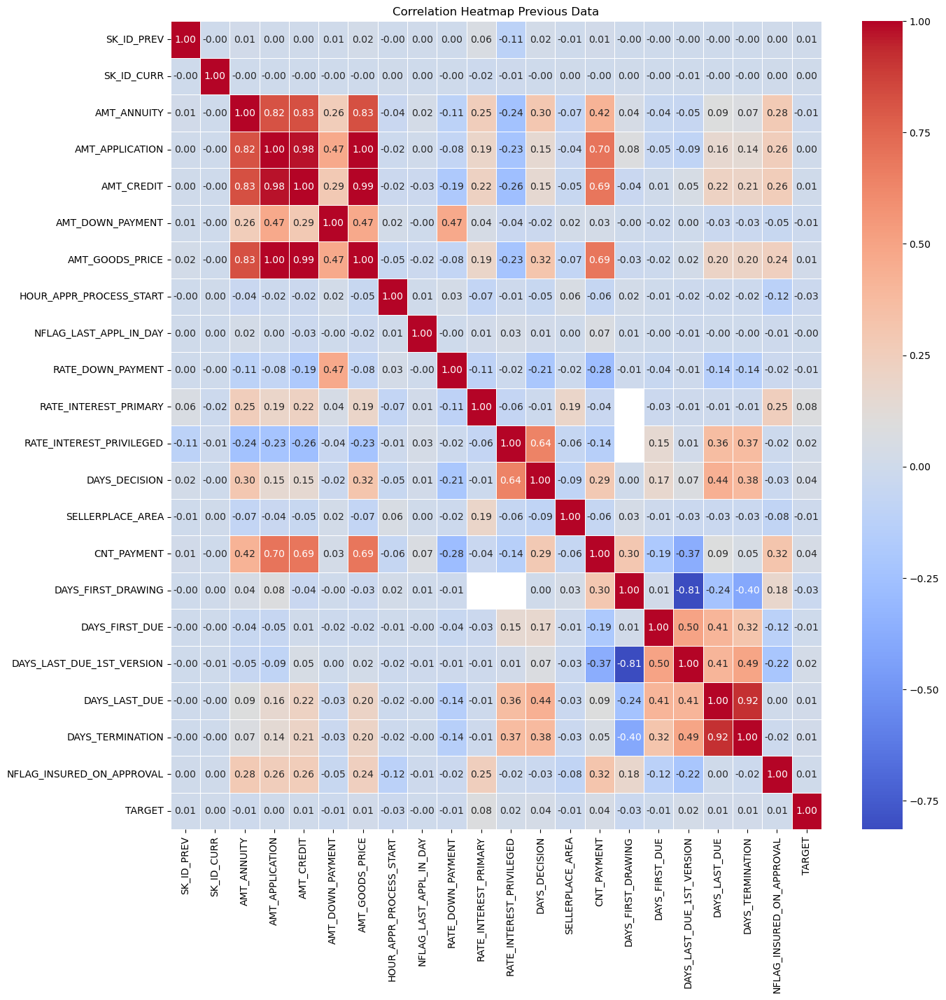

In [107]:
plt.figure(figsize=(15,15))
prev_corr = prev.corr()
sns.heatmap(prev_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap Previous Data')
plt.show()

Kolom yang memiliki korelasi tertinggi yakni `DAYS_DECISION` dengan nilai 0.04

### Kesimpulan 

- Train data yakni File utama yang berisi informasi tentang setiap aplikasi pinjaman
- Train data beirisi 307.511 baris dengan 122 kolom, untuk memudahkan analisis kami membagi kolom menjadi beberapa kelompok sesuai kategori nya yakni :
    - **Loan**
        - Kolom loan berisi informasi seputar pinjaman dengan 4 kolom numerik dan 1 kolom target 
        - Terdapat missing value pada 3 kolom diantaranya yaitu kolom `AMT_ANNUITY` dan`AMT_GOODS_PRICE` dengan proporsi dibawah 1%
        - **Terdapat Outlier di 3 kolom** diantaranya yaitu kolom `AMT_ANNUITY`,`AMT_CREDIT`dan`AMT_GOODS_PRICE`
        - **Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 3 kolom** diantara yakni `AMT_ANNUITY`,`AMT_CREDIT`dan`AMT_GOODS_PRICE`
        - **Multivariate Analysis**  Korelasi paling tinggi dengan target yakni kolom `AMT_GOODS_PRICE` dengan nilai -0.04
    - **Borrower**
        - Kolom borrower berisi informasi seputar peminjam dengan 14 kolom numerik dan 1 kolom target 
        - Terdapat missing value pada 1 kolom diantaranya yaitu kolom `CNT_FAM_MEMBERS` dengan proporsi dibawah 1%
        - **Terdapat Outlier di 5 kolom** diantaranya yaitu kolom `CNT_CHILDREN`, `AMT_INCOME_TOTAL`, `DAYS_EMPLOYED`,`REGION_POPULATION_RELATIVE`, `CNT_FAM_MEMBERS`
        - Terdapat 6 kolom biner diantaranya yakni `FLAG_MOBIL`, `FLAG_EMP_PHONE`, `FLAG_WORK_PHONE`, `FLAG_CONT_MOBILE`, `FLAG_PHONE`, `FLAG_EMAIL`
        - Terdapat 2 kolom multinomial diantaranya yakni `REGION_RATING_CLIENT`, `REGION_RATING_CLIENT_W_CITY`
        - **Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 5 kolom** diantara yakni `CNT_CHILDREN`, `AMT_INCOME_TOTAL`, `DAYS_EMPLOYED`,`REGION_POPULATION_RELATIVE`, `CNT_FAM_MEMBERS`
        -  **Multivariate Analysis** korelasi paling tinggi dengan target yakni kolom `DAYS_BIRTH` dengan nilai 0.08
    - **Loan App**
        - Kolom kategori Loan App berisi informasi seputar aplikasi pinjaman dengan 7 kolom numerik dan 1 kolom target 
        - Tidak terdapat missing value 
        - **Terdapat Outlier di 1 kolom** diantaranya yaitu kolom `HOUR_APPR_PROCESS_START`
        - Terdapat 7 kolom biner diantaranya yakni `REG_REGION_NOT_LIVE_REGION `, `REG_REGION_NOT_WORK_REGION `, `LIVE_REGION_NOT_WORK_REGION`, `REG_CITY_NOT_LIVE_CITY `, `REG_CITY_NOT_WORK_CITY`, `LIVE_CITY_NOT_WORK_CITY`
        - Terdapat 2 kolom multinomial diantaranya yakni `REGION_RATING_CLIENT`, `REGION_RATING_CLIENT_W_CITY`, `TARGET`
        - **Tidak terdapat positively skewed**(dilihat dari perbedaan antara mean dan median) dan cenderung simetris pada kolom `HOUR_APPR_PROCESS_START` 
        - **Multivariate Analysis** korelasi paling tinggi dengan target yakni kolom `REG_CITY_NOT_WORK_CITY` dengan nilai 0.05
    - **Biro Kredit**
        - Kolom biro kredit berisi informasi seputar biro kredit (eksternal) dengan 3  kolom numerik dan 1 kolom target 
        - **Terdapat missing value pada ketiga kolom** dengan persentase `EXT_SOURCE_1` = 46 %, `EXT_SOURCE_2` = 0.18%, `EXT_SOURCE_3` = 16%
        - **Tidak terdapat Outlier** di ketiga kolom
        - **Tidak terdapat positively skewed**(dilihat dari perbedaan antara mean dan median) dan cenderung simetris pada ketiga kolom 
        - **Multivariate Analysisi** korelasi paling tinggi dengan target yakni kolom `EXT_SOURCE_3` dengan nilai -0.18
    - **Properti Mode**
        - Kolom yang berkaitan dengan properti sepertinya memiliki beberapa kolom yang serupa perbedaannya hanya nilai yang mewakilinya saja, seperti properti_avg,properti_medi,dan properti mode,semuanya memiliki karakteristik yang sama hanya properti_mode saja yang memiliki perbedaan yang menonjol yakni dengan adanya tambahan kolom `TOTAL_AREA_MODE`
        - Kolom kategori properti_mode berisi informasi seputar properti yang mewakili nilai modus dengan 15 kolom numerik dan 1 kolom target 
        - **Terdapat missing value pada semua kolom kategori ini (15 Kolom)** kecuali kolom target yang kebanyakan diantaranya dengan persentase 39% - 57%
        - **Terdapat Outlier di 15 kolom** diantaranya yaitu semua kolom kecuali kolom `TARGET`
        - **Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom** diantaranya yakni `APARTMENTS_AVG`,`BASEMENTAREA_AVG`, `COMMONAREA_AVG `, `ELEVATORS_AVG `, `ENTRANCES_AVG  `, `FLOORSMAX_AVG `, `FLOORSMIN_AVG  `, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`, `TOTAL_AREA`
        - **Terdapat Negatively skewed pada 2 kolom** diantaranya yakni `YEARS_BEGINEXPLUATATION_AVG`,`YEARS_BUILD_AVG`
        - **Multivariate Analysis**  adapun korelasi paling tinggi dengan target yakni kolom `FLOORSMAX_MODE` dengan nilai -0.04
    -**Behavior**
        - Kolom kategori behavior berisi informasi seputar perilaku peminjam terkait aktivitas sosial dan kredit mereka dengan 10 kolom numerik dan 1 kolom target 
        - **Terdapat missing value pada semua kolom** kategori ini kecuali kolom target yang kebanyakan diantaranya dengan persentase 0.02 untuk kolom `OBS_30_CNT_SOCIAL_CIRCLE`, `DEF_30_CNT_SOCIAL_CIRCLE`,`DEF_60_CNT_SOCIAL_CIRCLE`,`DAYS_LAST_PHONE_CHANGE `, dan sisanya dengan persentase 11 %
        - **Terdapat Outlier di 10 kolom** diantaranya yaitu semua kolom kecuali kolom `TARGET`
        - **Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) 12 kolom** diantaranya yakni `OBS_30_CNT_SOCIAL_CIRCLE`,`DEF_30_CNT_SOCIAL_CIRCLE`, `DEF_60_CNT_SOCIAL_CIRCLE  `, `AMT_REQ_CREDIT_BUREAU_HOUR`, `AMT_REQ_CREDIT_BUREAU_DAY `, `AMT_REQ_CREDIT_BUREAU_WEEK`, `AMT_REQ_CREDIT_BUREAU_MON`, `LANDAREA_AVG  `, `LIVINGAPARTMENTS_AVG`, `LIVINGAREA_AVG`, `NONLIVINGAPARTMENTS_AVG`,`NONLIVINGAREA_AVG`, `AMT_REQ_CREDIT_BUREAU_QRT`,`AMT_REQ_CREDIT_BUREAU_YEAR`
        - **Terdapat Negatively skewed pada 1 kolom** diantaranya yakni `DAYS_LAST_PHONE_CHANGE`
        - **Multivariate Analysis** adapun korelasi paling tinggi dengan target yakni kolom `DAYS_LAST_PHONE_CHANGE` dengan nilai 0.06
    - **Bukti**
        - Kolom kategori bukti berisi informasi seputar keberadaan dokumen tertentu dengan 20 kolom numerik dan 1 kolom target 
        - Tidak terdapat missing value pada semua kolom kategori ini  
        - Semua kolom pada kategori ini bertipe biner.
        - **Multivariate Analysis** korelasi paling tinggi dengan target yakni kolom `FLAG_DOCUMENT_6` dengan nilai -0.03
- Kolom kategori tertinggi dengan target 1 pada kolom train yakni `NAME_CONTRACT_TYPE` dengan tipe  CASH_LOANS (y=7.6%)
- Data biro menyimpan informasi tentang semua pinjaman sebelumnya yang dimiliki klien dari lembaga keuangan lain yang dilaporkan ke Biro Kredit
- Data Biro berisi  15 kolom numerik dan 3 kolom object  dengan 1.716.428 baris
    - **Terdapat missing value pada 8 kolom** diantaranya yaitu kolom  `DAYS_ENDDATE_FACT`,`AMT_CREDIT_MAX_OVERDUE`,`AMT_CREDIT_SUM_LIMIT`,`AMT_ANNUITY`  `DAYS_CREDIT_ENDDATE`,`AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`, dan `TARGET` dengan proporsi dibawah 1 %
    - **Terdapat Outlier di 14 kolom** diantaranya yaitu kolom `CREDIT_DAY_OVERDUE`,
       `DAYS_CREDIT_ENDDATE`, `DAYS_ENDDATE_FACT`, `AMT_CREDIT_MAX_OVERDUE`,
       `CNT_CREDIT_PROLONG`, `AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`,
       `AMT_CREDIT_SUM_LIMIT`, `AMT_CREDIT_SUM_OVERDUE`, `DAYS_CREDIT_UPDATE`,
       `AMT_ANNUITY`.
    - **Terdapat positively skewed(dilihat dari perbedaan antara mean dan median) pada 8 kolom** diantara yakni `CREDIT_DAY_OVERDUE`,`DAYS_CREDIT_ENDDATE`,`AMT_CREDIT_MAX_OVERDUE`, `CNT_CREDIT_PROLONG`, `AMT_CREDIT_SUM`, `AMT_CREDIT_SUM_DEBT`, `AMT_CREDIT_SUM_LIMIT`,`AMT_ANNUITY`
    - **Terdapat negatively skewed di 3 kolom** diantaranya yakni `DAYS_CREDIT`, `DAYS_ENDDATE_FACT`,`DAYS_CREDIT_UPDATE `
    - **Multivariate Analysis**  yang paling tinggi berkorelasi dengan kolom target yakni ``DAYS_CREDIT`` dengan nilai 0.06
    
- Data Biro balance menyimpan informasi saldo bulanan pinjaman sebelumnya di Biro Kredit
- Data Biro Balance berisi  2 kolom numerik dan 1 kolom object  dengan  27.299.925 baris
    - Terdapat missing value pada kolom target dengan proporsi 46%
    - **Tidak terdapat outlier**
    - **Berdistribusi positively skewed**
    -**Multivariate Analysis** berkorelasi dengan kolom target yakni dengan nilai 0.03
- Kolom kategori tertinggi dengan target 1 pada data biro yakni `Credit_Currency` dengan tipe   currency   (y=7.8%)

- Data Posh Cash Balance Menyimpan informasi snapshot saldo bulanan pinjaman POS (point of sales) dan kas sebelumnya yang dimiliki pemohon dengan Home Credit
-  Data Posh cash Balance berisi 1.696.286 baris dengan 4 kolom numerik dan 1kolom object
    - Terdapat missing value pada 3 kolom `CNT_INSTALMENT` dan `CNT_INSTALMENT_FUTURE` dengan proporsi dibawah 24% dan kolom target dengan proporsi 17%
    - **Terdapat outlier di 4 kolom** yakni `CNT_INSTALMENT`, `CNT_INSTALMENT_FUTURE`,`SK_DPD`, `SK_DPD_DEF`
     - **Berdistribusi positively skewed**  pada kolom `CNT_INSTALMENT`, `CNT_INSTALMENT_FUTURE`,SK_DPD`, `SK_DPD_DEF`
     - **Multivariate Analysis** Kolom yang paling tinggi berkorelasi dengan kolom target yakni CNT_INSTALLMENT dengan nilai 0.03
- Kolom kategori tertinggi dengan target 1 pada data biro balance yakni `STATUS` dengan tipe   C  (y=1.6%)

- Data Installments menyimpan informasi riwayat pembayaran untuk kredit yang sebelumnya disalurkan di Home Credit yang terkait dengan pinjaman 
- Data Installments berisi 1.727.707 baris dengan 9 kolom numerik 
    - Terdapat missing value pada 3 kolom `DAYS_ENTRY_PAYMENT` dan `AMT_PAYMENT` dengan proporsi dibawah 1% dan kolom target dengan proporsi 17%
    - **Terdapat outlier di 4 kolom** yakni `NUM_INSTALMENT_VERSION`, `NUM_INSTALMENT_NUMBER`,`AMT_INSTALMENT`, `AMT_PAYMENT`
     - **Berdistribusi positively skewed**  pada kolom  `NUM_INSTALMENT_NUMBER`,`AMT_INSTALMENT`, `AMT_PAYMENT`
     - **Berdistribusi negatively skewed** `DAYS_INSTALMENT`, `DAYS_ENTRY_PAYMENT`
     - Terdapat kolom kategorik yakni kolom `NUM_INSTALMENT_VERSION`
     - **Multivariate Analysis** Kolom yang berkorelasi paling tinggi dengan target ialah kolom `DAYS_INSTALLMENT` dengan nilai 0.03
     
- Credit Data menyimpan informasi snapshot saldo bulanan kartu kredit sebelumnya yang dimiliki pemohon dengan Home Credit
- Data Credit  berisi 1.847.584 baris dengan 23 kolom numerik  dan 1 kolom object
    - Terdapat missing value pada  kolom `AMT_DRAWINGS_ATM_CURRENT`,`AMT_DRAWINGS_OTHER_CURRENT`, `AMT_DRAWINGS_POS_CURRENT`, `AMT_INST_MIN_REGULARITY`, `AMT_PAYMENT_CURRENT`, `CNT_DRAWINGS_ATM_CURRENT`, `CNT_DRAWINGS_POS_CURRENT`, `CNT_INSTALMENT_MATURE_CUM` dan `TARGET` dengan proporsi dibawah 18% 
    - **Terdapat outlier di 4 kolom** di semua kolom numerik
    - **Berdistribusi positively skewed**  pada semua kolom numerik
    -**Multivariate Analysis** kolom yang berkorelasi tinggi dengan target yakni kolom dengan nilai 0.04, kolom `AMT_RECEIVABLE`
    
- Data Previous menyimpan informasi semua pengajuan pinjaman Home Credit sebelumnya dari klien yang memiliki pinjaman
- Data Previous berisi 310.000  baris dengan 23 kolom numerik  dan 1 kolom object
    - Terdapat missing value pada  kolom `AMT_ANNUITY`,`AMT_ANNUITY `, `AMT_DOWN_PAYMENT`, `AMT_GOODS_PRICE`, `RATE_DOWN_PAYMENT`, `RATE_INTEREST_PRIMARY `, `RATE_INTEREST_PRIMARY`, `RATE_INTEREST_PRIVILEGED`, `NAME_TYPE_SUITE`, `CNT_PAYMENT`, `PRODUCT_COMBINATION`, `DAYS_FIRST_DRAWING`, `DAYS_FIRST_DUE`, `DAYS_LAST_DUE_1ST_VERSION`, `DAYS_LAST_DUE`, `DAYS_TERMINATION`,`NFLAG_INSURED_ON_APPROVA` dan `TARGET` dengan proporsi dibawah 18% 
    - **Terdapat outlier di semua kolom** numerik kecuali pada kolom `DAYS_DECISION`
    - **Berdistribusi negatif** pada kolom `NFLAG_LAST_APPL_IN_DAY`,`RATE_INTEREST_PREVILEGED`, `DAYS_FIRST_DRAWING`
     - **Berdistribusi positively skewed**  pada kolom , `SELLERPLACE_AREA`, `RATE_DOWN_PAYMENT`, `RATE_INTEREST_PRIMARY`, `DAYS_FIRST_DRAWING`, `DAYS_FIRST_DUE`, `DAYS_LAST_DUE_1ST_VERSION`, `DAYS_LAST_DUE`, `DAYS_TERMINATION`
    - Variabel biner dan variabel waktu yakni `HOUR_APPR_PROCESS_START` dan `DAYS_DECISION`
    - **Multivariate Analysis** Kolom yang memiliki korelasi tertinggi yakni `DAYS_DECISION` dengan nilai 0.04
-  Kolom kategori tertinggi dengan target 1 pada data Previous yakni `FLAG_LAST_APPL_PER_CONTRACT` dengan tipe Y (y=7.2%) 

**Setelah melakukan analisis multivariate dari 6 data tambahan**, maka kami mempertimbangkan untuk memasukkan kolom dengan korelasi paling tinggi dari data-data tambahan ke data train, kolom-kolom tersebut yakni:
- `DAYS_CREDIT` dari data Biro dengan nilai 0.06 dari data Biro, dengan asumsi bahwa semakin besar nilai DAYS_CREDIT, semakin tinggi kemungkinan risiko gagal bayar atau keterlambatan pembayaran
- `CREDIT_CURRENCY` dengan tipe   currency   (y=7.8%)
- `AMT_RECEIVABLE` dari data Credit dengan nilai 0.04, mengindikasikan hubungan positif yang lemah antara jumlah yang masih harus diterima (AMT_RECEIVABLE) dan risiko gagal bayar atau keterlambatan pembayaran. Korelasi positif menunjukkan bahwa dengan meningkatnya nilai AMT_RECEIVABLE, ada kecenderungan bahwa risiko kredit juga meningkat
- Kolom kategori tertinggi dengan target 1 pada data Previous yakni `FLAG_LAST_APPL_PER_CONTRACT` dengan tipe Y (y=7.2%) Nilai 'Y' pada FLAG_LAST_APPL_PER_CONTRACT mungkin mengindikasikan suatu kejadian atau kondisi bisnis tertentu yang secara khusus berkorelasi dengan target 1.

### Merge Dataframe

Sebelum melakukan merge data tambahan ke data utama yaitu application, dikarenakan data utama memiliki 122 kolom, dan terdapat beberapa kolom 
maka kami mempertimbangkan untuk drop beberapa kolom pada properti_avg dan properti_medi dikarenakan adanya keterbatasan

In [ ]:
# Menggabungkan kolom dari data previous
train = pd.merge(train, prev[prev['FLAG_LAST_APPL_PER_CONTRACT'] == 'Y'][['SK_ID_CURR', 'FLAG_LAST_APPL_PER_CONTRACT']], on='SK_ID_CURR', how='left')


# DATA PREPROCESSING

## Train Data

### Missing Values

In [113]:
train[loan].isna().sum()/ train.shape[0] * 100

SK_ID_CURR         0.000000
TARGET             0.000000
AMT_CREDIT         0.000000
AMT_ANNUITY        0.003902
AMT_GOODS_PRICE    0.090403
dtype: float64

In [80]:
train[loan].sample(5)

,SK_ID_CURR,TARGET,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE
34794,140315,0,835380.0,40320.0,675000.0
207997,341084,0,1030680.0,65997.0,900000.0
68095,178966,0,283419.0,22522.5,234000.0
171760,299060,0,180000.0,9000.0,180000.0
141853,264478,0,545040.0,19705.5,450000.0


- Karena kolom AMT_GOODS_PRICE memiliki hubungan yang erat dengan AMT_CREDIT, dan kebanyakan data pada kedua kolom memiliki nilai yang serupa maka
kami mempertimbangkan untuk menggantikan nilai null pada kolom AMT_GOODS_PRICE dengan nilai dari kolom AMT_CREDIT
- Missing value pada kolom annuity hanya 0.03% maka kami mempertimbangkan untuk membuang baris tersebut


In [114]:
train['AMT_GOODS_PRICE'].fillna(train['AMT_CREDIT'], inplace=True)
train.dropna(subset=['AMT_ANNUITY'], inplace=True)

In [115]:
train[borrower].isna().sum()

CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
REGION_POPULATION_RELATIVE     0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
CNT_FAM_MEMBERS                2
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
TARGET                         0
dtype: int64

Mengisi null values pada CNT_FAM_MEMBERS dengan nilai median, dikarenakan distribusi cenderung skewness,

In [116]:
train['CNT_FAM_MEMBERS'].fillna(train['CNT_FAM_MEMBERS'].median(), inplace=True)

In [117]:
train[biro_kredit].isna().sum() / train.shape[0] * 100

EXT_SOURCE_1    56.381972
EXT_SOURCE_2     0.214635
EXT_SOURCE_3    19.825756
TARGET           0.000000
dtype: float64

Dikarenakan ketiga kolom diatas cenderung berdistribusi normal dan tidak terdapat outlier maka kami mempertimbangkan untuk
mengisi null values dengan mean/nilai rata-rata

In [118]:
train['EXT_SOURCE_1'].fillna(train['EXT_SOURCE_1'].mean(), inplace=True)
train['EXT_SOURCE_2'].fillna(train['EXT_SOURCE_2'].mean(), inplace=True)
train['EXT_SOURCE_3'].fillna(train['EXT_SOURCE_3'].mean(), inplace=True)

In [119]:
train[properti_mode].isna().sum() / train.shape[0] * 100

APARTMENTS_MODE                 50.749759
BASEMENTAREA_MODE               58.515312
YEARS_BEGINEXPLUATATION_MODE    48.780972
YEARS_BUILD_MODE                66.497452
COMMONAREA_MODE                 69.872097
ELEVATORS_MODE                  53.296108
ENTRANCES_MODE                  50.348782
FLOORSMAX_MODE                  49.760812
FLOORSMIN_MODE                  67.848351
LANDAREA_MODE                   59.376128
LIVINGAPARTMENTS_MODE           68.354694
LIVINGAREA_MODE                 50.193334
NONLIVINGAPARTMENTS_MODE        69.432746
NONLIVINGAREA_MODE              55.179366
TOTALAREA_MODE                  48.268450
TARGET                           0.000000
dtype: float64

Kolom pada kelompok ini semuanya memiliki missing values yang sangat besar, dan hampir setengah dari data yang ada,dikarenakan semuanya terdapat outlier dan cenderung memiliki skewness, maka kami mengisi null values dengan nilai median

In [120]:
columns_to_fill_median = ['APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE',
                           'YEARS_BUILD_MODE', 'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE',
                           'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
                           'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'TOTALAREA_MODE']

for column in columns_to_fill_median:
    median_value = train[column].median()
    train[column].fillna(median_value, inplace=True)

In [91]:
train[behavior].isna().sum()

OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
DAYS_LAST_PHONE_CHANGE            1
AMT_REQ_CREDIT_BUREAU_HOUR    41518
AMT_REQ_CREDIT_BUREAU_DAY     41518
AMT_REQ_CREDIT_BUREAU_WEEK    41518
AMT_REQ_CREDIT_BUREAU_MON     41518
AMT_REQ_CREDIT_BUREAU_QRT     41518
AMT_REQ_CREDIT_BUREAU_YEAR    41518
TARGET                            0
dtype: int64

In [121]:
train[behavior].columns

Index(['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'TARGET'],
      dtype='object')

In [122]:
median = ['OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']

for column in median:
    medi_value = train[column].median()
    train[column].fillna(medi_value, inplace=True)

In [130]:
train[cats].isna().sum()

NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
OCCUPATION_TYPE                96391
WEEKDAY_APPR_PROCESS_START         0
ORGANIZATION_TYPE                  0
FONDKAPREMONT_MODE            210286
HOUSETYPE_MODE                154291
WALLSMATERIAL_MODE            156335
EMERGENCYSTATE_MODE           145749
TARGET                             0
dtype: int64

Untuk missing values pada data bertipe object, maka kami mempertimbangkan untuk menggunakan mode atau nilai modus

In [131]:
fill_mode = ['NAME_TYPE_SUITE', 'OCCUPATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 
                        'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']

for col in fill_mode:
    mode_value = train[col].mode().iloc[0]  
    train[col].fillna(mode_value, inplace=True)

### Duplicated Value

In [138]:
train.duplicated().sum()

0

Tidak terdapat duplicated value pada data train